In [1]:
import intake
from easygems import healpix as egh

import matplotlib.pyplot as plt
import warnings

warnings.filterwarnings("ignore", category=FutureWarning) 

In [2]:
import pandas as pd
import numpy as np
import cartopy.crs as ccrs
import cartopy.feature as cf

In [3]:
import xarray as xr
import os
from calendar import monthrange

In [4]:
from matplotlib.colors import BoundaryNorm

In [5]:
## Observations
obs_prw = xr.open_dataset('/global/cfs/cdirs/wcm_code/lpaccini/scripts/hackathon/hoap_wvpa.2020.nc')

In [5]:
mon_dir='/pscratch/sd/p/paccini/temp/hackathon/large_scale_monthly_means/'

In [6]:
### Load models
ds_scream = xr.open_mfdataset(mon_dir+'scream_ne120_monthly*.nc')
ds_um = xr.open_mfdataset(mon_dir+'um_glm_n2560_RAL3p3_monthly*.nc')
ds_icon = xr.open_mfdataset(mon_dir+'icon_d3hp003_monthly*.nc')
ds_nicam = xr.open_mfdataset(mon_dir+'nicam_gl11_monthly*.nc')
ds_ifs = xr.open_mfdataset(mon_dir+'ifs_tco3999_rcbmf_monthly*.nc')

In [7]:
pr_dir='/pscratch/sd/w/wcmca1/hackathon/cof_masks/stats/monthly/'
ds_pr_scream = xr.open_dataset(pr_dir+'scream_monthly_rainmap_cof_hp8_v1.nc')
ds_pr_um = xr.open_dataset(pr_dir+'um_glm_n2560_RAL3p3_monthly_rainmap_cof_hp8_v1.nc')
ds_pr_icon = xr.open_dataset(pr_dir+'icon_d3hp003_monthly_rainmap_cof_hp8_v1.nc')
ds_pr_nicam = xr.open_dataset(pr_dir+'nicam_gl11_monthly_rainmap_cof_hp8_v1.nc')
ds_pr_imerg = xr.open_dataset(pr_dir + 'IMERGv7_monthly_rainmap_cof_hp8_v1.nc')

In [41]:
mcs_pr_dir='/pscratch/sd/w/wcmca1/hackathon/mcs/'

ds_mcspr_scream = xr.open_dataset(mcs_pr_dir+'scream/stats/monthly/mcs_monthly_rainmap_hp6_20190801_20200831.nc')
ds_mcspr_um = xr.open_dataset(mcs_pr_dir+'um_glm_n2560_RAL3p3/stats/monthly/mcs_monthly_rainmap_hp8_20200201_20210228.nc')
ds_mcspr_icon = xr.open_dataset(mcs_pr_dir+'icon_d3hp003/stats/monthly/mcs_monthly_rainmap_hp6_20200102_20201231.nc')
ds_mcspr_nicam = xr.open_dataset(mcs_pr_dir+'nicam_gl11/stats/monthly/mcs_monthly_rainmap_hp8_20200301_20210228.nc')
ds_mcspr_imerg = xr.open_dataset(mcs_pr_dir + '/IMERGv7/stats/monthly/mcs_monthly_rainmap_hp8_20190801_20200831.nc')


In [37]:
ds_mcspr_um

<xarray.Dataset> Size: 11MB
Dimensions:                  (time: 13, cell: 49152)
Coordinates:
  * time                     (time) datetime64[ns] 104B 2020-02-01 ... 2021-0...
  * cell                     (cell) int64 393kB 0 1 2 3 ... 49149 49150 49151
    lat                      (cell) float64 393kB ...
    lon                      (cell) float64 393kB ...
    crs                      int64 8B ...
Data variables:
    precipitation            (time, cell) float32 3MB ...
    mcs_precipitation        (time, cell) float32 3MB ...
    mcs_precipitation_count  (time, cell) float32 3MB ...
    mcs_cloud_count          (time, cell) float32 3MB ...
    ntimes                   (time) float32 52B ...
Attributes:
    Title:                    Monthly MCS precipitation statistics
    contact:                  Zhe Feng, zhe.feng@pnnl.gov
    created_on:               Fri May 23 15:29:51 2025
    grid_type:                HEALPix
    zoom_level:               6
    time_interval:            1.0
    precipitation_threshold:  2.0

In [10]:
ds_mcspr_imerg

<xarray.Dataset> Size: 179MB
Dimensions:                  (time: 13, cell: 786432)
Coordinates:
  * time                     (time) datetime64[ns] 104B 2019-08-01 ... 2020-0...
  * cell                     (cell) int32 3MB 0 1 2 3 ... 786429 786430 786431
    lat                      (cell) float64 6MB ...
    lon                      (cell) float64 6MB ...
    crs                      int64 8B ...
Data variables:
    precipitation            (time, cell) float32 41MB ...
    mcs_precipitation        (time, cell) float32 41MB ...
    mcs_precipitation_count  (time, cell) float32 41MB ...
    mcs_cloud_count          (time, cell) float32 41MB ...
    ntimes                   (time) float32 52B ...
Attributes:
    Title:                    Monthly MCS precipitation statistics
    contact:                  Zhe Feng, zhe.feng@pnnl.gov
    created_on:               Thu Oct  9 11:58:41 2025
    grid_type:                HEALPix
    zoom_level:               8
    time_interval:            1.0
    precipitation_threshold:  2.0

In [31]:
!ls -ltr /pscratch/sd/w/wcmca1/hackathon/mcs/

total 32
drwxrws--- 7 feng045 m1867 4096 Apr  8  2025 IMERGv7
drwxrws--- 7 feng045 m1867 4096 Apr  8  2025 IMERGv6
drwxrwsr-x 5 wcmca1  m1867 4096 May 23  2025 icon_d3hp003
drwxrwsr-x 5 wcmca1  m1867 4096 May 23  2025 casesm2_10km_nocumulus
drwxrwsr-x 5 wcmca1  m1867 4096 May 23  2025 um_glm_n2560_RAL3p3
drwxrwsr-x 5 wcmca1  m1867 4096 Jun  4  2025 scream
drwxrwsr-x 5 wcmca1  m1867 4096 Aug 22 14:32 ifs_tco3999_rcbmf
drwxrws--- 5 feng045 m1867 4096 Oct  4 15:54 nicam_gl11


In [32]:
!ls -ltr /pscratch/sd/w/wcmca1/hackathon/mcs/ifs_tco3999_rcbmf/stats/monthly/

total 694552
-rw-rw---- 1 feng045 m1867  24263961 Oct  9 15:45 mcs_rainmap_202102.nc
-rw-rw---- 1 feng045 m1867  25094026 Oct  9 15:45 mcs_rainmap_202011.nc
-rw-rw---- 1 feng045 m1867  26051149 Oct  9 15:45 mcs_rainmap_202006.nc
-rw-rw---- 1 feng045 m1867  25255152 Oct  9 15:45 mcs_rainmap_202101.nc
-rw-rw---- 1 feng045 m1867  25663477 Oct  9 15:46 mcs_rainmap_202010.nc
-rw-rw---- 1 feng045 m1867  26644017 Oct  9 15:46 mcs_rainmap_202005.nc
-rw-rw---- 1 feng045 m1867  25074997 Oct  9 15:46 mcs_rainmap_202002.nc
-rw-rw---- 1 feng045 m1867  25161969 Oct  9 15:46 mcs_rainmap_202009.nc
-rw-rw---- 1 feng045 m1867  26369717 Oct  9 15:46 mcs_rainmap_202004.nc
-rw-rw---- 1 feng045 m1867  25877803 Oct  9 15:46 mcs_rainmap_202012.nc
-rw-rw---- 1 feng045 m1867  25618283 Oct  9 15:46 mcs_rainmap_202003.nc
-rw-rw---- 1 feng045 m1867  24924118 Oct  9 15:46 mcs_rainmap_202008.nc
-rw-rw---- 1 feng045 m1867  25286119 Oct  9 15:46 mcs_rainmap_202001.nc
-rw-rw---- 1 feng045 m1867  24806372 Oct  9 15:54 m

In [11]:
def convert_monthly_mm_to_mm_day(monthly_precip_da: xr.DataArray, time_coord: str = 'time') -> xr.DataArray:
    """
    Converts a DataArray of monthly accumulated precipitation (mm)
    to a DataArray of daily average precipitation (mm/day).

    Args:
        monthly_precip_da: The xarray DataArray containing monthly total
                           precipitation data (units: mm).
        time_coord: The name of the time coordinate (default: 'time').

    Returns:
        An xarray DataArray with precipitation in mm/day.
    """
    # Check if the time coordinate exists
    if time_coord not in monthly_precip_da.coords:
        raise ValueError(f"Time coordinate '{time_coord}' not found in DataArray.")
        
    # Get the number of days in each month from the time coordinate
    # This creates a new DataArray (aligned to the time dimension)
    # containing the number of days for each month (e.g., 31, 28, 31...)
    days_in_month = monthly_precip_da[time_coord].dt.days_in_month

    # Divide the monthly total by the number of days in the month.
    # xarray automatically broadcasts 'days_in_month' to match the
    # dimensions of 'monthly_precip_da' (e.g., time, lat, lon).
    daily_precip_da = monthly_precip_da / days_in_month

    # --- Good Practice: Update Attributes ---
    # Copy original attributes
    daily_precip_da.attrs = monthly_precip_da.attrs.copy()
    
    # Update units and add a description
    daily_precip_da.attrs['units'] = 'mm/day'
    daily_precip_da.attrs['description'] = 'Converted from monthly total (mm) to daily average (mm/day).'
    
    # Update the name of the DataArray
    if monthly_precip_da.name:
        daily_precip_da.name = f"{monthly_precip_da.name}_daily_avg"

    return daily_precip_da

In [12]:
ds_pr_scream_mmday = convert_monthly_mm_to_mm_day(ds_pr_scream['precipitation'])
ds_pr_um_mmday = convert_monthly_mm_to_mm_day(ds_pr_um['precipitation'])
ds_pr_icon_mmday = convert_monthly_mm_to_mm_day(ds_pr_icon['precipitation'])
ds_pr_nicam_mmday = convert_monthly_mm_to_mm_day(ds_pr_nicam['precipitation'])
ds_pr_imerg_mmday = convert_monthly_mm_to_mm_day(ds_pr_imerg['precipitation'])

In [42]:
ds_mcspr_scream_mmday = convert_monthly_mm_to_mm_day(ds_mcspr_scream['mcs_precipitation'])
ds_mcspr_um_mmday = convert_monthly_mm_to_mm_day(ds_mcspr_um['mcs_precipitation'])
ds_mcspr_icon_mmday = convert_monthly_mm_to_mm_day(ds_mcspr_icon['mcs_precipitation'])
ds_mcspr_nicam_mmday = convert_monthly_mm_to_mm_day(ds_mcspr_nicam['mcs_precipitation'])
ds_mcspr_imerg_mmday = convert_monthly_mm_to_mm_day(ds_mcspr_imerg['mcs_precipitation'])

In [43]:
ds_mcspr_um['mcs_precipitation'].mean('time')

<xarray.DataArray 'mcs_precipitation' (cell: 786432)> Size: 3MB
array([ 2.5887163 ,  0.44032753,  2.067436  , ..., 83.67484   ,
       94.155075  , 91.906876  ], shape=(786432,), dtype=float32)
Coordinates:
  * cell     (cell) int64 6MB 0 1 2 3 4 5 ... 786427 786428 786429 786430 786431
    lat      (cell) float64 6MB ...
    lon      (cell) float64 6MB ...
    crs      int64 8B ...

In [49]:
ds_mcspr_icon_mmday

<xarray.DataArray 'mcs_precipitation_daily_avg' (time: 12, cell: 786432)> Size: 75MB
array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]], shape=(12, 786432))
Coordinates:
  * time     (time) datetime64[ns] 96B 2020-01-02 2020-02-01 ... 2020-12-01
  * cell     (cell) int64 6MB 0 1 2 3 4 5 ... 786427 786428 786429 786430 786431
    lat      (cell) float64 6MB ...
    lon      (cell) float64 6MB ...
    crs      int64 8B 0
Attributes:
    long_name:    MCS precipitation
    units:        mm/day
    description:  Converted from monthly total (mm) to daily average (mm/day).

In [14]:
##daily
ds_pr_ifs = xr.open_dataset('/pscratch/sd/p/paccini/temp/hackathon/large_scale_monthly/ifs_2d_20200131_20210331.nc')
precip_ifs = (ds_pr_ifs["tprate"].squeeze()*3600*24).mean('time').compute() 

In [15]:
corrected_pr = xr.DataArray(
    data=(ds_pr_ifs["tprate"].squeeze()*3600*24).values,  # Use the raw NumPy data
    coords={
        'time': ds_pr_ifs['time'],   # Keep the original time coordinate
        'cell': ds_pr_ifs['cell'],   # Use the 'cell' coordinate for the second axis
    },
    dims=['time', 'cell']     # Explicitly name the dimensions
)
# Step 2.2: Replace the old variable in the dataset with our corrected one
ds_pr_ifs['pr'] = corrected_pr
ds_pr_ifs = ds_pr_ifs.drop_dims('value', errors='ignore')

In [16]:
import mycolors as mycmap

In [17]:
from functools import partial

In [18]:
def fix_coords(ds, lat_dim="lat", lon_dim="lon", roll=False):
    """
    Fix coordinates in a dataset:
    1. Convert longitude from -180/+180 to 0-360 range (optional)
    2. Roll dataset to start at longitude 0 (optional)
    3. Ensure coordinates are in ascending order
    
    Parameters:
    -----------
    ds : xarray.Dataset or xarray.DataArray
        Dataset with lat/lon coordinates
    lat_dim : str, optional
        Name of latitude dimension, default "lat"
    lon_dim : str, optional
        Name of longitude dimension, default "lon"
    roll : bool, optional, default=False
        If True, convert longitude from -180/+180 to 0-360, and roll the dataset to start at longitude 0
        
    Returns:
    --------
    xarray.Dataset or xarray.DataArray
        Dataset with fixed coordinates
    """
    if roll:
        # Find where longitude crosses from negative to positive (approx. where lon=0)
        lon_0_index = (ds[lon_dim] < 0).sum().item()
        
        # Create indexers for the roll
        lon_indices = np.roll(np.arange(ds.sizes[lon_dim]), -lon_0_index)
        
        # Roll dataset and convert longitudes to 0-360 range
        ds = ds.isel({lon_dim: lon_indices})
        lon360 = xr.where(ds[lon_dim] < 0, ds[lon_dim] + 360, ds[lon_dim])
        ds = ds.assign_coords({lon_dim: lon360})
    
    # Ensure latitude and longitude are in ascending order if needed
    if np.all(np.diff(ds[lat_dim].values) < 0):
        ds = ds.isel({lat_dim: slice(None, None, -1)})
    if np.all(np.diff(ds[lon_dim].values) < 0):
        ds = ds.isel({lon_dim: slice(None, None, -1)})
    
    return ds

def is_valid(ds, tolerance=0.1):
    """
    Limit extrapolation distance to a certain tolerance.
    This is useful for preventing extrapolation of regional data to global HEALPix grid.

    Args:
        ds (xarray.Dataset):
            The dataset containing latitude and longitude coordinates.
        tolerance (float): default=0.1
            The maximum allowed distance in [degrees] for extrapolation.

    Returns:
        xarray.DataSet.
    """
    return (np.abs(ds.lat - ds.lat_hp) < tolerance) & (np.abs(ds.lon - ds.lon_hp) < tolerance)

In [10]:
# Apply function to fix MCS mask dataset coordinates
obs_prw.pipe(fix_coords)

<xarray.Dataset> Size: 77MB
Dimensions:        (time: 12, lat: 320, lon: 720, nv: 2)
Coordinates:
  * time           (time) datetime64[ns] 96B 2020-01-01 ... 2020-12-01
  * lat            (lat) float64 3kB -79.75 -79.25 -78.75 ... 78.75 79.25 79.75
  * lon            (lon) float64 6kB -179.8 -179.2 -178.8 ... 178.8 179.2 179.8
Dimensions without coordinates: nv
Data variables:
    time_bnds      (time, nv) datetime64[ns] 192B ...
    lat_bnds       (lat, nv) float64 5kB ...
    lon_bnds       (lon, nv) float64 12kB ...
    record_status  (time) float32 48B ...
    wvpa           (time, lat, lon) float32 11MB ...
    numo           (time, lat, lon) float64 22MB ...
    numd           (time, lat, lon) timedelta64[ns] 22MB ...
    stdv           (time, lat, lon) float32 11MB ...
    satm           (time, lat, lon) int32 11MB ...
Attributes: (12/48)
    title:                       ECV Water vapour - Total Column Water Vapour
    summary:                     This dataset contains gridded Interim Climat...
    Conventions:                 CF-1.7,ACDD-1.3
    netcdf_library_version:      4.7.3 of Jan 28 2020 12:58:11 $
    institution:                 Deutscher Wetterdienst (DWD)
    project:                     Copernicus Climate Change Service (C3S), C3S...
    ...                          ...
    instrument_vocabulary:       GCMD Instruments, Version 8.6
    date_created:                2021-02-18T13:17:40 UTC
    date_modified:               2021-02-18T13:17:40 UTC
    history:                     2021-02-18T13:17:40 UTC: hoaps_grid -n -I .....
    platform:                    DMSP 5D-3/F16 > Defense Meteorological Satel...
    instrument:                  SSMIS > Special Sensor Microwave Imager/Sounder

In [19]:
def calculate_healpix_tolerance(zoom_level):
    """
    Calculate appropriate tolerance for is_valid function based on HEALPix zoom level.
    Returns approximately one grid cell size in degrees.
    
    Args:
        zoom_level (int): HEALPix zoom level
        
    Returns:
        float: Tolerance in degrees
    """
    # Calculate nside from zoom level (nside = 2^zoom)
    # nside determines HEALPix resolution - each increase in zoom doubles the resolution
    nside = 2 ** zoom_level
    
    # Calculate approximate pixel size in degrees
    # Mathematical derivation:
    # - Sphere has total area of 4π steradians (= 4π × (180/π)² sq. degrees)
    # - HEALPix divides sphere into 12 × nside² equal-area pixels
    # - Each pixel has area = 4π × (180/π)² / (12 × nside²) sq. degrees
    # - Linear size = √(pixel area) ≈ 58.6 / nside degrees
    # This gives approximately the angular width of one HEALPix cell
    pixel_size_degrees = 58.6 / nside
    
    return pixel_size_degrees

## HEALPix Regridding

The IFS model is at zoom level 7 (nside=128) while other models are at zoom level 6 (nside=64).
We need to downsample IFS data to match the other models' resolution for proper comparison.

In [20]:
def regrid_healpix(data, from_zoom, to_zoom):
    """
    Regrid HEALPix data from one zoom level to another.
    
    Args:
        data (xarray.DataArray): HEALPix data with 'cell' dimension
        from_zoom (int): Source zoom level
        to_zoom (int): Target zoom level
        
    Returns:
        xarray.DataArray: Regridded data at target zoom level
    """
    import healpy as hp
    
    nside_from = 2 ** from_zoom
    nside_to = 2 ** to_zoom
    
    if from_zoom == to_zoom:
        return data
    elif from_zoom > to_zoom:
        # Downsampling: higher resolution to lower resolution
        # Use ud_grade which averages pixels
        regridded_values = hp.ud_grade(data.values, nside_out=nside_to, order_in='NEST', order_out='NEST')
        
        # Create new coordinates for the target resolution
        ncells_to = 12 * nside_to ** 2
        new_cells = np.arange(ncells_to)
        
        # Calculate lat/lon for new cells
        theta, phi = hp.pix2ang(nside_to, new_cells, nest=True, lonlat=False)
        lon_new = np.rad2deg(phi)
        lat_new = 90 - np.rad2deg(theta)
        
        # Create new DataArray
        result = data.copy()
        result = result.isel(cell=slice(0, ncells_to))  # Resize
        result.values = regridded_values
        result = result.assign_coords({
            'cell': new_cells,
            'lon': ('cell', lon_new),
            'lat': ('cell', lat_new)
        })
        
        return result
    else:
        # Upsampling: lower resolution to higher resolution
        # This is generally not recommended as it doesn't add information
        raise ValueError(f"Upsampling from zoom {from_zoom} to {to_zoom} is not recommended. "
                        "Consider downsampling higher resolution data instead.")


In [21]:
lon_hp = ds_scream.lon.assign_coords(cell=ds_scream.cell, lon_hp=lambda da: da)
lat_hp = ds_scream.lat.assign_coords(cell=ds_scream.cell, lat_hp=lambda da: da)

In [64]:
calculate_healpix_tolerance(6)

0.915625

In [14]:
%%time
# Remap mask DataSet to HEALPix
obs_prw_hp = obs_prw.pipe(fix_coords).sel(lon=lon_hp, lat=lat_hp, method="nearest").where(
    partial(is_valid, tolerance=calculate_healpix_tolerance(6)))
# Drop unnecessary coordinates
obs_prw_hp = obs_prw_hp.drop_vars(["lat_hp", "lon_hp"])
obs_prw_hp

CPU times: user 45.6 s, sys: 173 ms, total: 45.8 s
Wall time: 45.8 s


<xarray.Dataset> Size: 33MB
Dimensions:        (time: 12, nv: 2, cell: 49152)
Coordinates:
  * time           (time) datetime64[ns] 96B 2020-01-01 ... 2020-12-01
    lat            (cell) float64 393kB 0.75 1.25 1.25 ... -1.25 -1.25 -0.75
    lon            (cell) float64 393kB 45.25 45.75 44.25 ... -45.75 -44.75
    crs            int64 8B 0
  * cell           (cell) int64 393kB 0 1 2 3 4 ... 49148 49149 49150 49151
Dimensions without coordinates: nv
Data variables:
    time_bnds      (time, nv, cell) datetime64[ns] 9MB dask.array<chunksize=(12, 2, 49152), meta=np.ndarray>
    lat_bnds       (cell, nv) float64 786kB dask.array<chunksize=(49152, 2), meta=np.ndarray>
    lon_bnds       (cell, nv) float64 786kB dask.array<chunksize=(49152, 2), meta=np.ndarray>
    record_status  (time, cell) float32 2MB dask.array<chunksize=(12, 49152), meta=np.ndarray>
    wvpa           (time, cell) float32 2MB dask.array<chunksize=(12, 49152), meta=np.ndarray>
    numo           (time, cell) float64 5MB dask.array<chunksize=(12, 49152), meta=np.ndarray>
    numd           (time, cell) timedelta64[ns] 5MB dask.array<chunksize=(12, 49152), meta=np.ndarray>
    stdv           (time, cell) float32 2MB dask.array<chunksize=(12, 49152), meta=np.ndarray>
    satm           (time, cell) float64 5MB dask.array<chunksize=(12, 49152), meta=np.ndarray>
Attributes: (12/48)
    title:                       ECV Water vapour - Total Column Water Vapour
    summary:                     This dataset contains gridded Interim Climat...
    Conventions:                 CF-1.7,ACDD-1.3
    netcdf_library_version:      4.7.3 of Jan 28 2020 12:58:11 $
    institution:                 Deutscher Wetterdienst (DWD)
    project:                     Copernicus Climate Change Service (C3S), C3S...
    ...                          ...
    instrument_vocabulary:       GCMD Instruments, Version 8.6
    date_created:                2021-02-18T13:17:40 UTC
    date_modified:               2021-02-18T13:17:40 UTC
    history:                     2021-02-18T13:17:40 UTC: hoaps_grid -n -I .....
    platform:                    DMSP 5D-3/F16 > Defense Meteorological Satel...
    instrument:                  SSMIS > Special Sensor Microwave Imager/Sounder

In [98]:
## load ERA5
current_location = "NERSC"
cat = intake.open_catalog("https://digital-earths-global-hackathon.github.io/catalog/catalog.yaml")[current_location]
ds_era5 = cat["ERA5"](zoom=6).to_dask() 

In [99]:
ds_era5

<xarray.Dataset> Size: 136GB
Dimensions:  (time: 1008, cell: 49152, level: 37)
Coordinates:
  * cell     (cell) float32 197kB 0.0 1.0 2.0 ... 4.915e+04 4.915e+04 4.915e+04
    crs      float32 4B ...
    lat      (cell) float32 197kB dask.array<chunksize=(49152,), meta=np.ndarray>
  * level    (level) float32 148B 1.0 2.0 3.0 5.0 ... 925.0 950.0 975.0 1e+03
    lon      (cell) float32 197kB dask.array<chunksize=(49152,), meta=np.ndarray>
  * time     (time) datetime64[ns] 8kB 1940-01-01 1940-02-01 ... 2023-12-01
Data variables: (12/111)
    100u     (time, cell) float32 198MB dask.array<chunksize=(24, 16384), meta=np.ndarray>
    100v     (time, cell) float32 198MB dask.array<chunksize=(24, 16384), meta=np.ndarray>
    10fg     (time, cell) float32 198MB dask.array<chunksize=(24, 16384), meta=np.ndarray>
    10si     (time, cell) float32 198MB dask.array<chunksize=(24, 16384), meta=np.ndarray>
    10u      (time, cell) float32 198MB dask.array<chunksize=(24, 16384), meta=np.ndarray>
    10v      (time, cell) float32 198MB dask.array<chunksize=(24, 16384), meta=np.ndarray>
    ...       ...
    uvb      (time, cell) float32 198MB dask.array<chunksize=(24, 16384), meta=np.ndarray>
    v        (time, level, cell) float32 7GB dask.array<chunksize=(24, 4, 4096), meta=np.ndarray>
    vo       (time, level, cell) float32 7GB dask.array<chunksize=(24, 4, 4096), meta=np.ndarray>
    w        (time, level, cell) float32 7GB dask.array<chunksize=(24, 4, 4096), meta=np.ndarray>
    z        (time, level, cell) float32 7GB dask.array<chunksize=(24, 4, 4096), meta=np.ndarray>
    zust     (time, cell) float32 198MB dask.array<chunksize=(24, 16384), meta=np.ndarray>
Attributes:
    acknowledgment:  Contains modified Copernicus Climate Change Service info...
    contact:         lukas.kluft@mpimet.mpg.de
    creator:         Lukas Kluft
    description:     HEALPixelation of ERA5
    source:          Post-processed dataset based on the ERA5 mirror located ...

In [18]:
ds_sfcwind_era = np.sqrt(ds_era5['10u']**2 + ds_era5['10v']**2)

In [100]:
ti = '2020-01-01'; tf = '2020-12-31'
prw_scream = (ds_scream["prw"]).squeeze().mean('time').compute() #.sel(time=slice(ti,tf)
prw_icon = (ds_icon["prw"].sel(time=slice(ti,tf)).squeeze()).mean('time').compute() 
prw_um = (ds_um["prw"].sel(time=slice(ti,tf)).squeeze()).mean('time').compute() 
prw_era = (ds_era5["tcwv"].sel(time=slice(ti,tf)).squeeze()).mean('time').compute() 
prw_nicam = (ds_nicam["prw"].squeeze()).mean('time').compute()  #.sel(time=slice(ti,tf)
prw_ifs = (ds_ifs["prw"].sel(time=slice(ti,tf)).squeeze()).mean('time').compute() 
# 

In [48]:
prw_obs = (obs_prw_hp["wvpa"].sel(time=slice(ti,tf)).squeeze()).mean('time').compute() 

In [12]:
# landfraction
dslf_scream = xr.open_dataset('/pscratch/sd/p/paccini/temp/hackathon/large_scale_monthly/scream_2d_20190831_20200930.nc')

In [101]:
# Regrid IFS from zoom 7 to zoom 6 to match other models
# This downsamples from nside=128 (3,145,728 cells) to nside=64 (786,432 cells)
# by averaging neighboring pixels
prw_ifs_regridded = regrid_healpix(prw_ifs, from_zoom=7, to_zoom=6)
print(f"Original IFS shape: {prw_ifs.shape}, Regridded shape: {prw_ifs_regridded.shape}")

Original IFS shape: (196608,), Regridded shape: (49152,)


In [22]:
pr_scream = (ds_pr_scream_mmday).squeeze().mean('time').compute() #.sel(time=slice(ti,tf)
pr_icon = (ds_pr_icon_mmday.squeeze()).mean('time').compute() 
pr_um = (ds_pr_um_mmday.squeeze()).mean('time').compute() 
pr_imerg_hp8 = (ds_pr_imerg_mmday.squeeze()).mean('time').compute() 
pr_nicam = (ds_pr_nicam_mmday).mean('time').compute()  #.sel(time=slice(ti,tf)
pr_ifs = (ds_pr_ifs["pr"].sel(time=slice('2020-01-01','2020-12-31')).squeeze()).mean('time').compute() 

In [44]:
mcspr_scream_hp6 = (ds_mcspr_scream_mmday).squeeze().mean('time').compute() #.sel(time=slice(ti,tf)
mcspr_icon_hp6 = (ds_mcspr_icon_mmday.squeeze()).mean('time').compute() 
mcspr_um_hp6 = (ds_mcspr_um_mmday.squeeze()).mean('time').compute() 
mcspr_imerg_hp6 = (ds_mcspr_imerg_mmday.squeeze()).mean('time').compute() 
mcspr_nicam_hp6 = (ds_mcspr_nicam_mmday).mean('time').compute()  #.sel(time=slice(ti,tf)

In [45]:
mcspr_nicam_hp6 = regrid_healpix(mcspr_nicam_hp6, from_zoom=8, to_zoom=6)
mcspr_imerg_hp6 = regrid_healpix(mcspr_imerg_hp6, from_zoom=8, to_zoom=6)
mcspr_um_hp6 = regrid_healpix(mcspr_um_hp6, from_zoom=8, to_zoom=6)

In [25]:
pr_ifs_regridded = regrid_healpix(pr_ifs, from_zoom=7, to_zoom=6)
pr_scream_regridded = regrid_healpix(pr_scream, from_zoom=8, to_zoom=6)
pr_icon_regridded = regrid_healpix(pr_icon, from_zoom=8, to_zoom=6)
pr_um_regridded = regrid_healpix(pr_um, from_zoom=8, to_zoom=6)
pr_imerg_regridded = regrid_healpix(pr_imerg_hp8, from_zoom=8, to_zoom=6)
pr_nicam_regridded = regrid_healpix(pr_nicam, from_zoom=8, to_zoom=6)

In [46]:
### q850
ti = '2020-01-01'; tf = '2020-12-31'
q850_scream = (ds_scream["hus"]*1e3).sel(pressure=850).squeeze().mean('time').compute() 
q850_icon = (ds_icon["hus"]*1e3).sel(pressure=850).sel(time=slice(ti,tf)).squeeze().mean('time').compute() 
q850_um = (ds_um["hus"]*1e3).sel(pressure=850).sel(time=slice(ti,tf)).squeeze().mean('time').compute() 
q850_ifs = (ds_ifs["hus"]*1e3).sel(pressure=850).sel(time=slice(ti,tf)).squeeze().mean('time').compute() 
q850_era5 = (ds_era5['q']*1e3).sel(level=850).sel(time=slice(ti,tf)).squeeze().mean('time').compute() 
q850_nicam = (ds_nicam['hus']*1e3).sel(pressure=850).sel(time=slice(ti,tf)).squeeze().mean('time').compute() 

In [48]:
q850_ifs_regridded = regrid_healpix(q850_ifs, from_zoom=7, to_zoom=6)

In [63]:
### omega500
omega500_scream = ds_scream["omega"].sel(pressure=500).squeeze().mean('time').compute() 
omega500_icon = ds_icon["omega"].sel(pressure=500).sel(time=slice(ti,tf)).squeeze().mean('time').compute() 
omega500_um = ds_um["omega"].sel(pressure=500).sel(time=slice(ti,tf)).squeeze().mean('time').compute() 
omega500_ifs = ds_ifs["omega"].sel(pressure=500).sel(time=slice(ti,tf)).squeeze().mean('time').compute() 
omega500_era5 = ds_era5['w'].sel(level=500).sel(time=slice(ti,tf)).squeeze().mean('time').compute() 
omega500_nicam = ds_nicam['omega'].sel(pressure=500).sel(time=slice(ti,tf)).squeeze().mean('time').compute() 

In [64]:
# Regrid omega500 IFS data as well
omega500_ifs_regridded = regrid_healpix(omega500_ifs, from_zoom=7, to_zoom=6)

In [59]:
### omega850
omega850_scream = ds_scream["omega"].sel(pressure=850).squeeze().mean('time').compute() 
omega850_icon = ds_icon["omega"].sel(pressure=850).sel(time=slice(ti,tf)).squeeze().mean('time').compute() 
omega850_um = ds_um["omega"].sel(pressure=850).sel(time=slice(ti,tf)).squeeze().mean('time').compute() 
omega850_ifs = ds_ifs["omega"].sel(pressure=850).sel(time=slice(ti,tf)).squeeze().mean('time').compute() 
omega850_era5 = ds_era5['w'].sel(level=850).sel(time=slice(ti,tf)).squeeze().mean('time').compute() 
omega850_nicam = ds_nicam['omega'].sel(pressure=850).sel(time=slice(ti,tf)).squeeze().mean('time').compute()

In [60]:
# Regrid omega850 IFS data as well
omega850_ifs_regridded = regrid_healpix(omega850_ifs, from_zoom=7, to_zoom=6)

In [22]:
### sfcwind
ti = '2020-01-01'; tf = '2020-12-31'
sfcwind_scream = ds_scream["sfcWind"].mean('time').compute() 
sfcwind_icon = ds_icon["sfcWind"].sel(time=slice(ti,tf)).squeeze().mean('time').compute() 
sfcwind_um = ds_um["sfcWind"].sel(time=slice(ti,tf)).squeeze().mean('time').compute() 
sfcwind_ifs = ds_ifs["sfcWind"].sel(time=slice(ti,tf)).squeeze().mean('time').compute() 
sfcwind_era5 = ds_sfcwind_era.sel(time=slice(ti,tf)).squeeze().mean('time').compute() 
sfcwind_nicam = ds_nicam['sfcWind'].sel(time=slice(ti,tf)).squeeze().mean('time').compute()

In [23]:
# Regrid omega850 IFS data as well
sfcwind_ifs_regridded = regrid_healpix(sfcwind_ifs, from_zoom=7, to_zoom=6)

In [26]:
all_tropics = {
    'xlim': (-180, 180),
    'ylim': (-30, 30),
    'xloc': [-180, -120, -60, 0, 60, 120, 180],
    'yloc': [-30, -15, 0, 15, 30],
    'coastline_color': 'gray',
    'label_size': 8,
    'grid_alpha': 0.3,
    'cbar_ticksize': 7,
    'title': 'Test'}

In [27]:
def trop_wpacific(ds):
    return tropics(ds) & (ds.lon > 150) & (ds.lon < 170)

def tropics(ds):
    return np.abs(ds.lat) <= 30.1

def ocean(ds):
    return ds.LANDFRAC == 0

def smallbox_wpacific(ds):
    return (ds.lon > 134.9) & (ds.lon < 145.1) & (ds.lat > 1.9) & (ds.lat < 9.1)


def box_wpacific(ds):
    return (ds.lon >= 150) & (ds.lon <= 180) & (ds.lat >= -5) & (ds.lat <= 10)
def box_epacific(ds):
    # return (ds.lon >= -165) & (ds.lon <= -95) & (ds.lat >= 0) & (ds.lat <= 15)
    return (ds.lon >= -150) & (ds.lon <= -95) & (ds.lat >= 0) & (ds.lat <= 15)
def box_indian(ds):
    return (ds.lon >= 55) & (ds.lon <= 95) & (ds.lat >= -10) & (ds.lat <= 5)
def box_atlantic(ds):
    return (ds.lon >= -45) & (ds.lon <= -20) & (ds.lat >= 0) & (ds.lat <= 15)

In [28]:
import helper_2d_sample as helper

In [29]:
def plot_map_single(var, ax, projection=None, extent=None, colorbar_label="", title="", 
                   add_lat_lines=False, **kwargs):
    """
    Single map plotting function for use in subplots
    
    Parameters:
    -----------
    var: data set
    ax: matplotlib axis object
    projection: cartopy projection (optional, will use ax projection if None)
    extent: map extent
    colorbar_label: label for the colorbar
    title: title string
    add_lat_lines: if True, add horizontal lines at 30N and 30S
    **kwargs: get passed to imshow
    
    Returns:
    --------
    imsh: image object for colorbar creation
    """
    if extent is not None:
        ax.set_extent(extent, crs=ccrs.PlateCarree())
    else:
        ax.set_global()
    
    varmap = helper.get_nn_data(var, ax=ax)
    imsh = ax.imshow(
        varmap, extent=ax.get_xlim() + ax.get_ylim(), origin="lower", **kwargs
    )
    ax.add_feature(cf.COASTLINE, linewidth=0.8)
    
    # Add latitude lines at 30N and 30S
    if add_lat_lines:
        import numpy as np
        lons_line = np.linspace(-180, 180, 100)
        ax.plot(lons_line, np.full_like(lons_line, 30), 
               transform=ccrs.PlateCarree(), 
               color='gray', linewidth=1, alpha=0.7, linestyle='--')
        ax.plot(lons_line, np.full_like(lons_line, -30), 
               transform=ccrs.PlateCarree(), 
               color='gray', linewidth=1, alpha=0.7, linestyle='--')
    
    ax.set_title(title, fontsize=10)
    return imsh

def plot_map_diff_single(var, ref, ax, extent=None, title="", add_lat_lines=False, **kwargs):
    """
    Single difference map plotting function for use in subplots
    """
    if extent is not None:
        ax.set_extent(extent, crs=ccrs.PlateCarree())
    else:
        ax.set_global()
    
    varmap = helper.get_nn_data(var, ax=ax)
    refmap = helper.get_nn_data(ref, ax=ax)
    imsh = ax.imshow(
        varmap - refmap, extent=ax.get_xlim() + ax.get_ylim(), origin="lower", **kwargs
    )
    ax.add_feature(cf.COASTLINE, linewidth=0.8)
    
    # Add latitude lines at 30N and 30S
    if add_lat_lines:
        import numpy as np
        lons_line = np.linspace(-180, 180, 100)
        ax.plot(lons_line, np.full_like(lons_line, 30), 
               transform=ccrs.PlateCarree(), 
               color='gray', linewidth=1, alpha=0.7, linestyle='--')
        ax.plot(lons_line, np.full_like(lons_line, -30), 
               transform=ccrs.PlateCarree(), 
               color='gray', linewidth=1, alpha=0.7, linestyle='--')
    
    ax.set_title(title, fontsize=10)
    return imsh

In [30]:
def plot_anomalies(datasets, dataset_names, ref_idx=0, colorbar_label="", 
                         suptitle="", extent=None, figsize=(15, 8), add_lat_lines=True, draw_regions=None,
                         show_spread=True, vmax_spread =None, **kwargs):
    """
    Scenario 1: All subplots showing their mean values with one shared colorbar
    
    Parameters:
    -----------
    datasets: list of datasets
    dataset_names: list of names for each dataset
    ref_idx: index of reference dataset (default: 0)
    colorbar_label: label for the colorbar
    suptitle: super title for the entire figure
    extent: map extent
    figsize: figure size
    show_spread: if True, add a subplot showing model spread (std dev) in the last empty position
    **kwargs: passed to imshow
    """
    # projection = ccrs.Robinson(central_longitude=-135.5808361)
    # model_datasets = [datasets[i] for i in range(len(datasets)) if i != ref_idx]
    # model_names = [dataset_names[i] for i in range(len(dataset_names)) if i != ref_idx]
    
    projection = ccrs.Robinson(central_longitude=-135.5808361)
    model_datasets = [datasets[i] for i in range(len(datasets)) if i != ref_idx]
    model_names = [dataset_names[i] for i in range(len(dataset_names)) if i != ref_idx]
    n_models = len(model_datasets)
    # Calculate grid dimensions
    ncols = 3 if n_models > 4 else min(n_models, 3)
    nrows = (n_models + ncols - 1) // ncols
    
    fig, axes = plt.subplots(
        nrows, ncols, figsize=figsize, 
        subplot_kw={"projection": projection}, 
        constrained_layout=True
    )
    
    if n_models == 1:
        axes = [axes]
    elif nrows == 1:
        axes = axes
    else:
        axes = axes.flatten()

    ref_dataset = datasets[ref_idx]
    ref_name = dataset_names[ref_idx]
    # Calculate global vmin/vmax for consistent colorbar
    if 'vmin' not in kwargs or 'vmax' not in kwargs:
        # all_data = []
        all_diffs = []
        for dataset in model_datasets:
            var_map = helper.get_nn_data(dataset, ax=None)
            ref_map = helper.get_nn_data(ref_dataset, ax=None)
            if var_map is not None and ref_map is not None:
                diff_data = (var_map - ref_map).flatten()
                all_diffs.extend(diff_data[~np.isnan(diff_data)])           

        if all_diffs:
            if 'vmin' not in kwargs:
                kwargs['vmin'] = np.percentile(all_diffs, 2)
            if 'vmax' not in kwargs:
                kwargs['vmax'] = np.percentile(all_diffs, 98)
    
    images = []
    for i, (dataset, name) in enumerate(zip(model_datasets, model_names)):
        if i < len(axes):
            title = f"{name} - {ref_name}"
            imsh = plot_map_diff_single(
                dataset, ref_dataset, 
                axes[i], extent=extent, title=title, add_lat_lines=add_lat_lines, **kwargs
            )
            images.append(imsh)
    
    # Add model spread subplot in the last empty position
    if show_spread and len(model_datasets) < len(axes):
        spread_idx = len(model_datasets)
        
        # Calculate std dev on HEALPix grid (before projection)
        try:
            # Stack all model data on the original HEALPix grid
            model_stack = np.stack([ds.values for ds in model_datasets], axis=0)
            std_dev_healpix = np.std(model_stack, axis=0, ddof=1)
            
            # Create an xarray DataArray with the same structure as the original datasets
            std_dev_da = model_datasets[0].copy()
            std_dev_da.values = std_dev_healpix
            
            # Plot the standard deviation map
            ax_spread = axes[spread_idx]
            if extent is not None:
                ax_spread.set_extent(extent, crs=ccrs.PlateCarree())
            else:
                ax_spread.set_global()
            
            std_map = helper.get_nn_data(std_dev_da, ax=ax_spread)
            
            # Use a different colormap for spread (no diverging colormap needed)
            spread_cmap = kwargs.get('cmap', 'viridis')
            if 'cmap' in kwargs:
                spread_cmap = 'YlOrRd'  # Sequential colormap for spread
            
            if vmax_spread!=None:
                imsh_spread = ax_spread.imshow(
                    std_map, 
                    extent=ax_spread.get_xlim() + ax_spread.get_ylim(), 
                    origin="lower",
                    cmap=spread_cmap,
                    vmin=0,vmax= vmax_spread 
                )
            else:
                imsh_spread = ax_spread.imshow(
                std_map, 
                extent=ax_spread.get_xlim() + ax_spread.get_ylim(), 
                origin="lower",
                cmap=spread_cmap,
                vmin=0  # std dev is always non-negative
            )
            ax_spread.add_feature(cf.COASTLINE, linewidth=0.8)
            
            if add_lat_lines:
                lons_line = np.linspace(-180, 180, 100)
                ax_spread.plot(lons_line, np.full_like(lons_line, 30), 
                       transform=ccrs.PlateCarree(), 
                       color='gray', linewidth=1, alpha=0.7, linestyle='--')
                ax_spread.plot(lons_line, np.full_like(lons_line, -30), 
                       transform=ccrs.PlateCarree(), 
                       color='gray', linewidth=1, alpha=0.7, linestyle='--')
            
            # Draw region boxes if requested
            if draw_regions is not None:
                from matplotlib.patches import Rectangle
                
                # Define colors for different regions
                region_colors = {
                    "W Pacific": 'k',
                    "E Pacific": 'k',
                    "Indian": 'k',
                    "Atlantic": 'k'
                }
                
                for region_name, bounds in draw_regions.items():
                    lon_min, lon_max, lat_min, lat_max = bounds
                    
                    # Get color for this region (default to white if not defined)
                    color = region_colors.get(region_name, 'white')
                    
                    # Create rectangle in PlateCarree coordinates
                    width = lon_max - lon_min
                    height = lat_max - lat_min
                    
                    rect = Rectangle(
                        (lon_min, lat_min), width, height,
                        linewidth=2, edgecolor=color, facecolor='none',
                        transform=ccrs.PlateCarree(), zorder=10
                    )
                    ax_spread.add_patch(rect)
                    
                    # Add label near the center of the box
                    # label_lon = lon_min + width / 2
                    # label_lat = lat_max + 2  # Slightly above the box
                    # ax_spread.text(label_lon, label_lat, region_name,
                    #              transform=ccrs.PlateCarree(),
                    #              fontsize=6, 
                    #              color=color, ha='center',
                    #              bbox=dict(boxstyle='round,pad=0.3', facecolor='none', 
                    #                        alpha=0.7, edgecolor='none'),
                    #              zorder=11)
            
            ax_spread.set_title("Model Spread (Std Dev)", fontsize=10)
            
            # Add separate colorbar for spread (horizontal, positioned below the subplot)
            cbar_spread = fig.colorbar(imsh_spread, ax=ax_spread, orientation='horizontal', 
                                      shrink=0.6, pad=0.05, aspect=15)
            cbar_spread.set_label(colorbar_label, fontsize=8)
            cbar_spread.ax.tick_params(labelsize=7)
            
        except Exception as e:
            print(f"Warning: Could not calculate model spread: {e}")
            axes[spread_idx].set_visible(False)
    
    # Hide remaining unused subplots
    start_hide = len(model_datasets) + (1 if show_spread else 0)
    for i in range(start_hide, len(axes)):
        axes[i].set_visible(False)
    
    # Add colorbar for difference maps
    cbar = fig.colorbar(images[0], ax=axes[:len(model_datasets)], shrink=0.8, pad=0.02)
    cbar.set_label(colorbar_label)
    
    if suptitle:
        fig.suptitle(suptitle, fontsize=14, y=0.95)
    
    return fig, axes, images





In [114]:
def plot_anomalies(datasets, dataset_names, ref_idx=0, colorbar_label="", 
                         suptitle="", extent=None, figsize=(15, 8), add_lat_lines=True, draw_regions=None,
                         show_spread=True, vmax_spread=None,exclude_obs4spread=True, norm_type='linear', linthresh=1.0, custom_levels=None, **kwargs):
    """
    Scenario 1: All subplots showing their mean values with one shared colorbar
    
    Parameters:
    -----------
    datasets: list of datasets
    dataset_names: list of names for each dataset
    ref_idx: index of reference dataset (default: 0)
    colorbar_label: label for the colorbar
    suptitle: super title for the entire figure
    extent: map extent
    figsize: figure size
    show_spread: if True, add a subplot showing model spread (std dev) in the last empty position
    vmax_spread: maximum value for spread colorbar
    norm_type: 'linear', 'log', 'symlog' (symmetric log for data with pos/neg values) or 'custom' (for discrete levels)
    linthresh: For symlog, the range within which the plot is linear (default: 1.0)
    **kwargs: passed to imshow
    """
    from matplotlib.colors import LogNorm, SymLogNorm, Normalize
    
    projection = ccrs.Robinson(central_longitude=-135.5808361)
    model_datasets = [datasets[i] for i in range(len(datasets)) if i != ref_idx]
    model_names = [dataset_names[i] for i in range(len(dataset_names)) if i != ref_idx]
    n_models = len(model_datasets)
    
    # Calculate grid dimensions
    ncols = 3 if n_models > 4 else min(n_models, 3)
    nrows = (n_models + ncols - 1) // ncols
    
    fig, axes = plt.subplots(
        nrows, ncols, figsize=figsize, 
        subplot_kw={"projection": projection}, 
        constrained_layout=True
    )
    
    if n_models == 1:
        axes = [axes]
    elif nrows == 1:
        axes = axes
    else:
        axes = axes.flatten()

    ref_dataset = datasets[ref_idx]
    ref_name = dataset_names[ref_idx]
    
    # Calculate global vmin/vmax for consistent colorbar
    if 'vmin' not in kwargs or 'vmax' not in kwargs:
        all_diffs = []
        for dataset in model_datasets:
            var_map = helper.get_nn_data(dataset, ax=None)
            ref_map = helper.get_nn_data(ref_dataset, ax=None)
            if var_map is not None and ref_map is not None:
                diff_data = (var_map - ref_map).flatten()
                all_diffs.extend(diff_data[~np.isnan(diff_data)])           

        if all_diffs:
            if 'vmin' not in kwargs:
                kwargs['vmin'] = np.percentile(all_diffs, 2)
            if 'vmax' not in kwargs:
                kwargs['vmax'] = np.percentile(all_diffs, 98)
    
    # Create normalization based on norm_type
    if norm_type == 'custom' and custom_levels is not None:
        # Use custom discrete levels
        norm = BoundaryNorm(custom_levels, ncolors=256, clip=True)
    elif norm_type == 'log':
        # For log scale, all values must be positive
        norm = LogNorm(vmin=kwargs.get('vmin', 0.1), vmax=kwargs.get('vmax', 10))
    elif norm_type == 'symlog':
        # Symmetric log scale - good for data with both positive and negative values
        # linthresh defines the range [-linthresh, linthresh] where scale is linear
        norm = SymLogNorm(linthresh=linthresh, 
                         vmin=kwargs.get('vmin', -20), 
                         vmax=kwargs.get('vmax', 20),
                         base=10)
    else:  # 'linear'
        norm = Normalize(vmin=kwargs.get('vmin'), vmax=kwargs.get('vmax'))
    
    # Remove vmin/vmax from kwargs since we're using norm
    plot_kwargs = {k: v for k, v in kwargs.items() if k not in ['vmin', 'vmax']}
    plot_kwargs['norm'] = norm
    
    images = []
    for i, (dataset, name) in enumerate(zip(model_datasets, model_names)):
        if i < len(axes):
            title = f"{name} - {ref_name}"
            imsh = plot_map_diff_single(
                dataset, ref_dataset, 
                axes[i], extent=extent, title=title, add_lat_lines=add_lat_lines, **plot_kwargs
            )
            images.append(imsh)
    
    # Add model spread subplot in the last empty position
    if show_spread and len(model_datasets) < len(axes):
        spread_idx = len(model_datasets)
        
        try:
            # Select datasets for std calculation (exclude observations if requested)
            datasets_for_std = model_datasets[1:] if exclude_obs4spread else model_datasets
            # Stack all model data on the original HEALPix grid
            model_stack = np.stack([ds.values for ds in datasets_for_std], axis=0)
            std_dev_healpix = np.std(model_stack, axis=0, ddof=1)
            
            # Create an xarray DataArray with the same structure as the original datasets
            std_dev_da = model_datasets[0].copy()
            std_dev_da.values = std_dev_healpix
            
            # Plot the standard deviation map
            ax_spread = axes[spread_idx]
            if extent is not None:
                ax_spread.set_extent(extent, crs=ccrs.PlateCarree())
            else:
                ax_spread.set_global()
            
            std_map = helper.get_nn_data(std_dev_da, ax=ax_spread)
            
            # Use a different colormap for spread (no diverging colormap needed)
            spread_cmap = kwargs.get('cmap', 'viridis')
            if 'cmap' in kwargs:
                spread_cmap = 'YlOrRd'  # Sequential colormap for spread
            
            # Create normalization for spread (always positive, can use log)
            if norm_type == 'log':
                spread_norm = LogNorm(vmin=0.1, vmax=vmax_spread if vmax_spread else np.nanmax(std_map))
            else:
                spread_norm = Normalize(vmin=0, vmax=vmax_spread if vmax_spread else None)
            
            imsh_spread = ax_spread.imshow(
                std_map, 
                extent=ax_spread.get_xlim() + ax_spread.get_ylim(), 
                origin="lower",
                cmap=spread_cmap,
                norm=spread_norm
            )
            
            ax_spread.add_feature(cf.COASTLINE, linewidth=0.8)
            
            if add_lat_lines:
                lons_line = np.linspace(-180, 180, 100)
                ax_spread.plot(lons_line, np.full_like(lons_line, 30), 
                       transform=ccrs.PlateCarree(), 
                       color='gray', linewidth=1, alpha=0.7, linestyle='--')
                ax_spread.plot(lons_line, np.full_like(lons_line, -30), 
                       transform=ccrs.PlateCarree(), 
                       color='gray', linewidth=1, alpha=0.7, linestyle='--')
            
            # Draw region boxes if requested
            if draw_regions is not None:
                from matplotlib.patches import Rectangle
                
                region_colors = {
                    "W Pacific": 'k',
                    "E Pacific": 'k',
                    "Indian": 'k',
                    "Atlantic": 'k'
                }
                
                for region_name, bounds in draw_regions.items():
                    lon_min, lon_max, lat_min, lat_max = bounds
                    color = region_colors.get(region_name, 'white')
                    width = lon_max - lon_min
                    height = lat_max - lat_min
                    
                    rect = Rectangle(
                        (lon_min, lat_min), width, height,
                        linewidth=2, edgecolor=color, facecolor='none',
                        transform=ccrs.PlateCarree(), zorder=10
                    )
                    ax_spread.add_patch(rect)
            
            ax_spread.set_title("Model Spread (Std Dev)", fontsize=10)
            
            # Add separate colorbar for spread
            cbar_spread = fig.colorbar(imsh_spread, ax=ax_spread, orientation='horizontal', 
                                      shrink=0.6, pad=0.05, aspect=15)
            cbar_spread.set_label(colorbar_label, fontsize=8)
            cbar_spread.ax.tick_params(labelsize=7)
            
        except Exception as e:
            print(f"Warning: Could not calculate model spread: {e}")
            axes[spread_idx].set_visible(False)
    
    # Hide remaining unused subplots
    start_hide = len(model_datasets) + (1 if show_spread else 0)
    for i in range(start_hide, len(axes)):
        axes[i].set_visible(False)
    
    # Add colorbar for difference maps
    cbar = fig.colorbar(images[0], ax=axes[:len(model_datasets)], shrink=0.8, pad=0.02)
    cbar.set_label(colorbar_label)
    
    if suptitle:
        fig.suptitle(suptitle, fontsize=14, y=0.95)
    
    return fig, axes, images

In [105]:
TROPICAL_BELT = (-30, 30) 
datasets = [prw_era,
            prw_scream, 
            prw_icon, 
            prw_um,
            prw_ifs_regridded,
           prw_nicam]
dataset_names = ['ERA5', 'SCREAM', 'ICON', 'UM', 'IFS', 'NICAM']

In [29]:
print(prw_scream.shape,
      prw_icon.shape,
      prw_um.shape,
      prw_era.shape,
      prw_nicam.shape,
      prw_ifs.shape)

(49152,) (49152,) (49152,) (49152,) (49152,) (196608,)


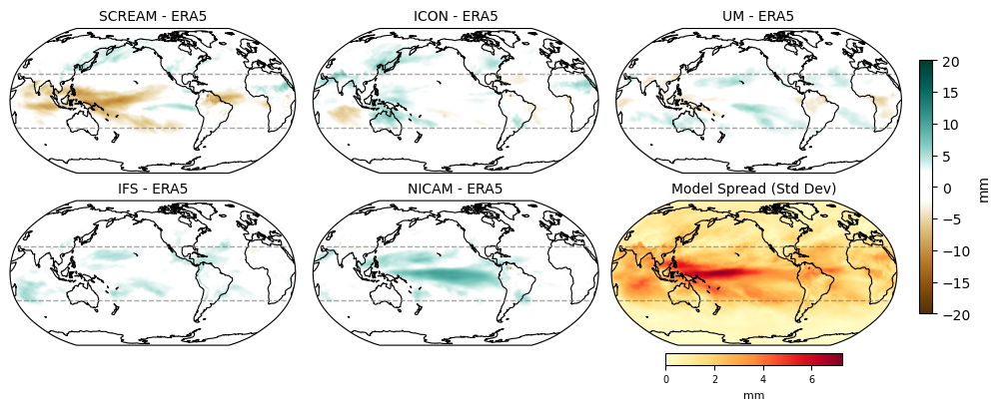

In [50]:
## full period

fig3, axes3, images3 = plot_anomalies(
    datasets, dataset_names, ref_idx=0, figsize=(10, 4),
    colorbar_label="mm",
    suptitle="",
    cmap=mycmap.brownTOwhiteTOgreen, vmin=-20, vmax=20
)

plt.savefig('plots/PRW_bias_fullyear.png', dpi=300, bbox_inches='tight')

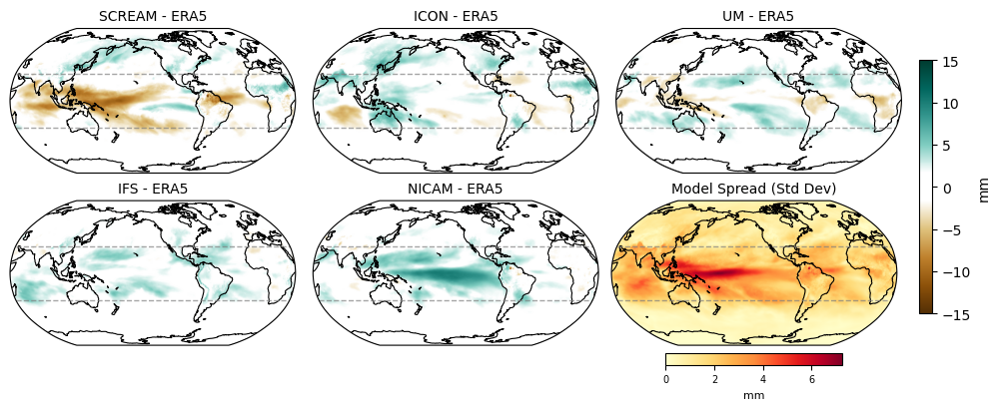

In [73]:
# def plot_std_map(model_datasets, custom_levels = np.arange(0,6,1),colorbar_label="",  extent=None, **kwargs):

#     projection = ccrs.Robinson(central_longitude=-135.5808361)
#     fig, ax = plt.subplots(1,1, figsize=(6,6), subplot_kw={"projection": projection})
    
#     # Stack all model data on the original HEALPix grid
#     model_stack = np.stack([ds.values for ds in model_datasets], axis=0)
#     std_dev_healpix = np.std(model_stack, axis=0, ddof=1)
    
#     # Create an xarray DataArray with the same structure as the original datasets
#     std_dev_da = model_datasets[0].copy()
#     std_dev_da.values = std_dev_healpix
    
#     # Plot the standard deviation map
#     ax_spread = ax
#     if extent is not None:
#         ax_spread.set_extent(extent, crs=ccrs.PlateCarree())
#     else:
#         ax_spread.set_global()
    
#     std_map = helper.get_nn_data(std_dev_da, ax=ax_spread)
    
#     # Use a different colormap for spread (no diverging colormap needed)
#     spread_cmap = kwargs.get('cmap', 'viridis')
#     if 'cmap' in kwargs:
#         spread_cmap = kwargs.get('cmap')  # Sequential colormap for spread
    
#     # Create normalization for spread (always positive, can use log)
#     spread_norm = norm = BoundaryNorm(custom_levels, ncolors=256, clip=True) 
    
#     imsh_spread = ax_spread.imshow(
#         std_map, 
#         extent=ax_spread.get_xlim() + ax_spread.get_ylim(), 
#         origin="lower",
#         cmap=spread_cmap,
#         norm=spread_norm
#     )
    
#     ax_spread.add_feature(cf.COASTLINE, linewidth=0.8)
#     # Add separate colorbar for spread
#     cbar_spread = fig.colorbar(imsh_spread, ax=ax_spread, orientation='horizontal', 
#                               shrink=0.6, pad=0.05, aspect=15)
#     cbar_spread.set_label(colorbar_label, fontsize=8)
#     cbar_spread.ax.tick_params(labelsize=7)

In [86]:
def plot_std_map(model_datasets, custom_levels = np.arange(0,6,1), colorbar_label="", extent=None, 
                 mcs_datasets=None, mcs_std_threshold=None, mcs_contour_color='k', 
                 mcs_contour_linewidth=1, mcs_contour_smooth_sigma=2, **kwargs):
    """
    Plot standard deviation map with optional MCS contour overlay.
    
    Parameters:
    -----------
    model_datasets : list
        List of datasets for the main shaded plot
    custom_levels : array-like
        Contour levels for the shaded plot
    colorbar_label : str
        Label for the colorbar
    extent : tuple or None
        Map extent [lon_min, lon_max, lat_min, lat_max]
    mcs_datasets : list or None
        Optional list of MCS datasets for contour overlay
    mcs_std_threshold : float or None
        Standard deviation threshold value for MCS contour
    mcs_contour_color : str
        Color of the MCS contour line (default: 'k')
    mcs_contour_linewidth : float
        Width of the MCS contour line (default: 1)
    mcs_contour_smooth_sigma : float
        Gaussian smoothing sigma for MCS contour (default: 2)
    **kwargs : dict
        Additional keyword arguments (e.g., cmap)
    """
    from scipy.ndimage import gaussian_filter
    
    projection = ccrs.Robinson(central_longitude=-135.5808361)
    fig, ax = plt.subplots(1,1, figsize=(6,6), subplot_kw={"projection": projection})
    
    # Stack all model data on the original HEALPix grid
    model_stack = np.stack([ds.values for ds in model_datasets], axis=0)
    std_dev_healpix = np.std(model_stack, axis=0, ddof=1)
    
    # Create an xarray DataArray with the same structure as the original datasets
    std_dev_da = model_datasets[0].copy()
    std_dev_da.values = std_dev_healpix
    
    # Plot the standard deviation map
    ax_spread = ax
    if extent is not None:
        ax_spread.set_extent(extent, crs=ccrs.PlateCarree())
    else:
        ax_spread.set_global()
    
    std_map = helper.get_nn_data(std_dev_da, ax=ax_spread)
    
    # Use a different colormap for spread (no diverging colormap needed)
    spread_cmap = kwargs.get('cmap', 'viridis')
    if 'cmap' in kwargs:
        spread_cmap = kwargs.get('cmap')  # Sequential colormap for spread
    
    # Create normalization for spread (always positive, can use log)
    spread_norm = norm = BoundaryNorm(custom_levels, ncolors=256, clip=True) 
    
    imsh_spread = ax_spread.imshow(
        std_map, 
        extent=ax_spread.get_xlim() + ax_spread.get_ylim(), 
        origin="lower",
        cmap=spread_cmap,
        norm=spread_norm
    )
    
    # Add MCS contour if datasets and threshold are provided
    if mcs_datasets is not None and mcs_std_threshold is not None:
        # Calculate standard deviation for MCS datasets
        mcs_stack = np.stack([ds.values for ds in mcs_datasets], axis=0)
        mcs_std_healpix = np.std(mcs_stack, axis=0, ddof=1)
        
        # Create DataArray for MCS std
        mcs_std_da = mcs_datasets[0].copy()
        mcs_std_da.values = mcs_std_healpix
        
        # Convert to map grid using the same helper function
        mcs_std_map = helper.get_nn_data(mcs_std_da, ax=ax_spread)
        
        # Apply Gaussian smoothing
        mcs_std_map_smooth = gaussian_filter(mcs_std_map, sigma=mcs_contour_smooth_sigma)
        
        # Create contour
        # Get the extent for the contour plot
        extent_vals = ax_spread.get_xlim() + ax_spread.get_ylim()
        x = np.linspace(extent_vals[0], extent_vals[1], mcs_std_map_smooth.shape[1])
        y = np.linspace(extent_vals[2], extent_vals[3], mcs_std_map_smooth.shape[0])
        
        ax_spread.contour(x, y, mcs_std_map_smooth, levels=[mcs_std_threshold], 
                         colors=mcs_contour_color, linewidths=mcs_contour_linewidth,
                         transform=ax_spread.transData)
    
    ax_spread.add_feature(cf.COASTLINE, linewidth=0.8)
    # Add separate colorbar for spread
    cbar_spread = fig.colorbar(imsh_spread, ax=ax_spread, orientation='horizontal', 
                              shrink=0.6, pad=0.05, aspect=15)
    cbar_spread.set_label(colorbar_label, fontsize=8)
    cbar_spread.ax.tick_params(labelsize=7)
    
    return fig, ax

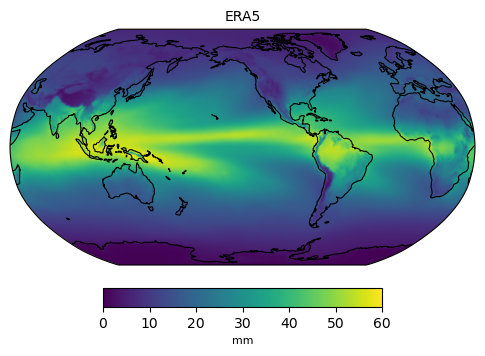

In [68]:
projection = ccrs.Robinson(central_longitude=-135.5808361)
fig, ax = plt.subplots(1,1, figsize=(6,6), subplot_kw={"projection": projection})
image = plot_map_single(prw_era,ax=ax,colorbar_label='mm',vmin=0,vmax=60)

# cbar_ax = fig.add_axes([0.87, 0.15, 0.03, 0.7])  # [left, bottom, width, height]
# cbar = fig.colorbar(images, cax=cbar_ax)
cbar_spread = fig.colorbar(image, ax=ax, orientation='horizontal', 
                                      shrink=0.6, pad=0.05, aspect=15)
ax.set_title('ERA5',fontsize=10)
cbar_spread.set_label('mm', fontsize=8)
plt.savefig('plots/PRW_meanvalue_ERA5.png', dpi=300, bbox_inches='tight')

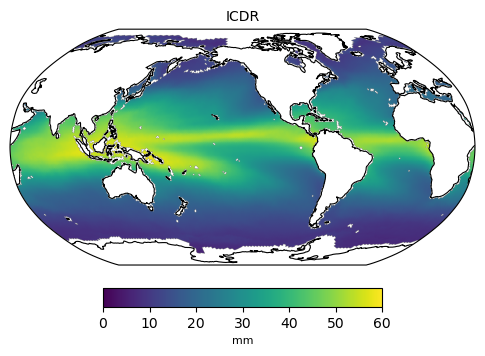

In [69]:
projection = ccrs.Robinson(central_longitude=-135.5808361)
fig, ax = plt.subplots(1,1, figsize=(6,6), subplot_kw={"projection": projection})
image = plot_map_single(prw_obs,ax=ax,colorbar_label='mm',vmin=0,vmax=60)

cbar_spread = fig.colorbar(image, ax=ax, orientation='horizontal', 
                                      shrink=0.6, pad=0.05, aspect=15)
ax.set_title('ICDR',fontsize=10)
cbar_spread.set_label('mm', fontsize=8)
plt.savefig('plots/PRW_meanvalue_ICDR.png', dpi=300, bbox_inches='tight')

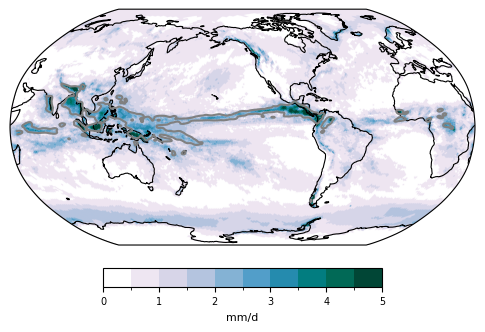

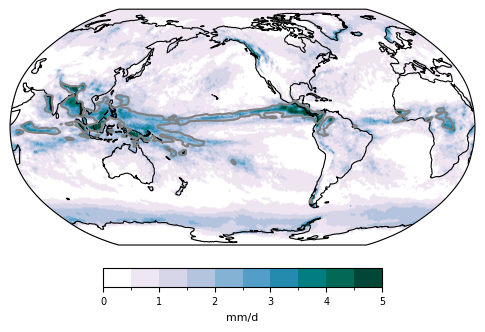

In [120]:
datasets = [ pr_scream_regridded, 
            pr_icon_regridded, pr_um_regridded,
            pr_ifs_regridded, pr_nicam_regridded]

mcs_datasets = [ mcspr_scream_hp6, 
                mcspr_icon_hp6, mcspr_um_hp6, mcspr_nicam_hp6]

plot_std_map(datasets, extent=None, colorbar_label="mm/d", 
             cmap=mycmap.whiteTOblueTOgreen, #'YlOrRd', #
             custom_levels=np.arange(0, 5.5, .5),
             mcs_datasets=mcs_datasets, 
             mcs_std_threshold=2,  # Set your desired threshold
             mcs_contour_color='gray',  # Optional: defaults to black
             mcs_contour_linewidth=1.5,  # Optional: defaults to 1
             mcs_contour_smooth_sigma=3)  # Optional: defaults to 2
plt.savefig('plots/PR_shaded_MCSPR_contour.png', dpi=300, bbox_inches='tight')

### Example: Plot with Region Boxes

You can add boxes highlighting specific regions on the model spread subplot by passing a `draw_regions` parameter.

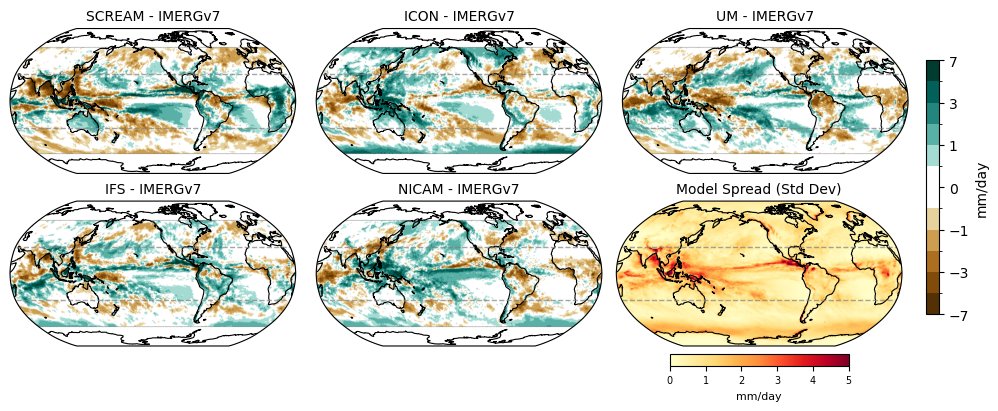

In [43]:
TROPICAL_BELT = (-60, 60) 
datasets = [pr_imerg_regridded.where(
    (pr_imerg_regridded['lat']> TROPICAL_BELT[0]) &(pr_imerg_regridded['lat']< TROPICAL_BELT[1])),
            pr_scream_regridded, 
            pr_icon_regridded, 
            pr_um_regridded,
            pr_ifs_regridded,
           pr_nicam_regridded]
dataset_names = ['IMERGv7', 'SCREAM', 'ICON', 'UM','IFS', 'NICAM']
pr_levels = [ -7, -5, -3, -2, -1, -0.5, 0, 0.5, 1, 2, 3, 5, 7]

# Plot with region boxes
fig_regions, axes_regions, images_regions = plot_anomalies(
    datasets, dataset_names, ref_idx=0, figsize=(10, 4),
    colorbar_label="mm/day",
    suptitle="",
    cmap=mycmap.brownTOwhiteTOgreen, norm_type='custom',  # Use custom discrete levels
    custom_levels=pr_levels,  # Pass the levels
    vmax_spread=5,
    draw_regions=None  # Add this parameter to draw region boxes
)

plt.savefig('plots/PR_bias_fullyear.png', dpi=300, bbox_inches='tight')

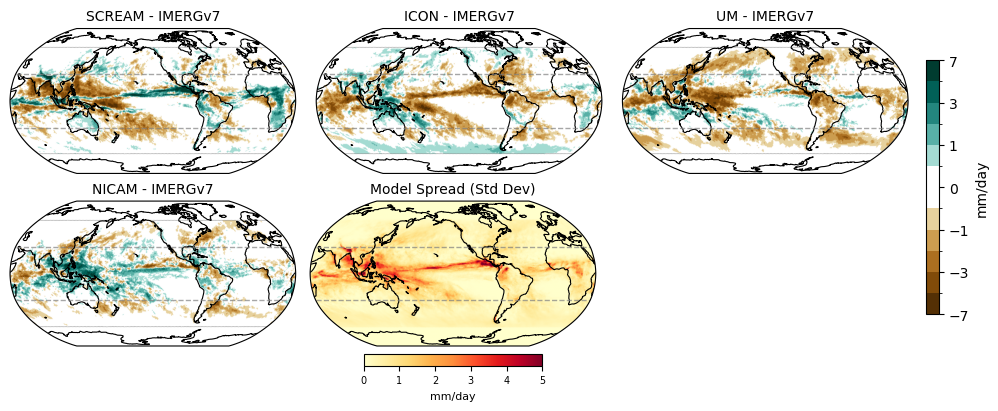

In [48]:
TROPICAL_BELT = (-60, 60) 
datasets = [mcspr_imerg_hp6.where(
    (mcspr_imerg_hp6['lat']> TROPICAL_BELT[0]) &(mcspr_imerg_hp6['lat']< TROPICAL_BELT[1])),
            mcspr_scream_hp6, 
            mcspr_icon_hp6, 
            mcspr_um_hp6,
            # mcspr_ifs_regridded,
           mcspr_nicam_hp6]
dataset_names = ['IMERGv7', 'SCREAM', 'ICON', 'UM', 'NICAM']
pr_levels = [ -7, -5, -3, -2, -1, -0.5, 0, 0.5, 1, 2, 3, 5, 7]


# Plot with region boxes
fig_regions, axes_regions, images_regions = plot_anomalies(
    datasets, dataset_names, ref_idx=0, figsize=(10, 4),
    colorbar_label="mm/day",
    suptitle="",
    cmap=mycmap.brownTOwhiteTOgreen, norm_type='custom',  # Use custom discrete levels
    custom_levels=pr_levels,  # Pass the levels
    vmax_spread=5,
    draw_regions=None  # Add this parameter to draw region boxes
)

plt.savefig('plots/MCSpr_bias_fullyear.png', dpi=300, bbox_inches='tight')

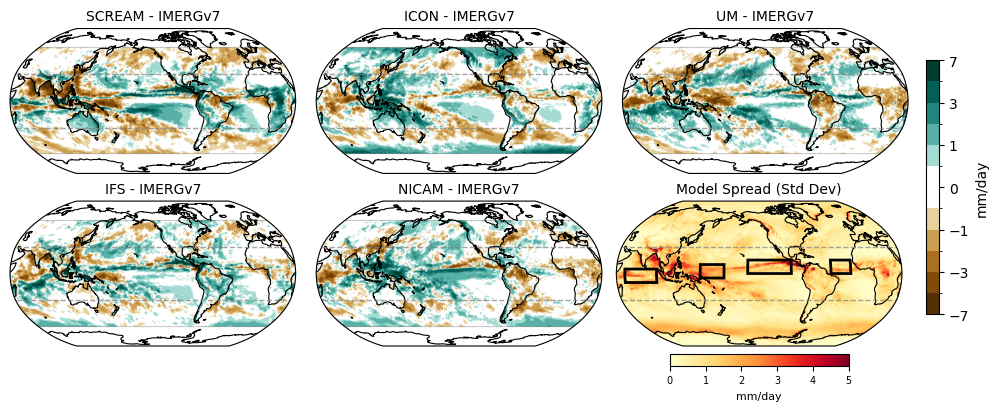

In [39]:
TROPICAL_BELT = (-60, 60) 
datasets = [pr_imerg_regridded.where(
    (pr_imerg_regridded['lat']> TROPICAL_BELT[0]) &(pr_imerg_regridded['lat']< TROPICAL_BELT[1])),
            pr_scream_regridded, 
            pr_icon_regridded, 
            pr_um_regridded,
            pr_ifs_regridded,
           pr_nicam_regridded]
dataset_names = ['IMERGv7', 'SCREAM', 'ICON', 'UM','IFS', 'NICAM']
pr_levels = [ -7, -5, -3, -2, -1, -0.5, 0, 0.5, 1, 2, 3, 5, 7]

regions_to_draw = {
    "W Pacific": (150, 180, -5, 10),
    "E Pacific": (-150, -95, 0, 15),
    "Indian": (55, 95, -10, 5),
    "Atlantic": (-45, -20, 0, 15)
}

# Plot with region boxes
fig_regions, axes_regions, images_regions = plot_anomalies(
    datasets, dataset_names, ref_idx=0, figsize=(10, 4),
    colorbar_label="mm/day",
    suptitle="",
    cmap=mycmap.brownTOwhiteTOgreen, norm_type='custom',  # Use custom discrete levels
    custom_levels=pr_levels,  # Pass the levels
    vmax_spread=5,
    draw_regions=regions_to_draw  # Add this parameter to draw region boxes
)

plt.savefig('plots/PR_bias_fullyear_with_regions.png', dpi=300, bbox_inches='tight')

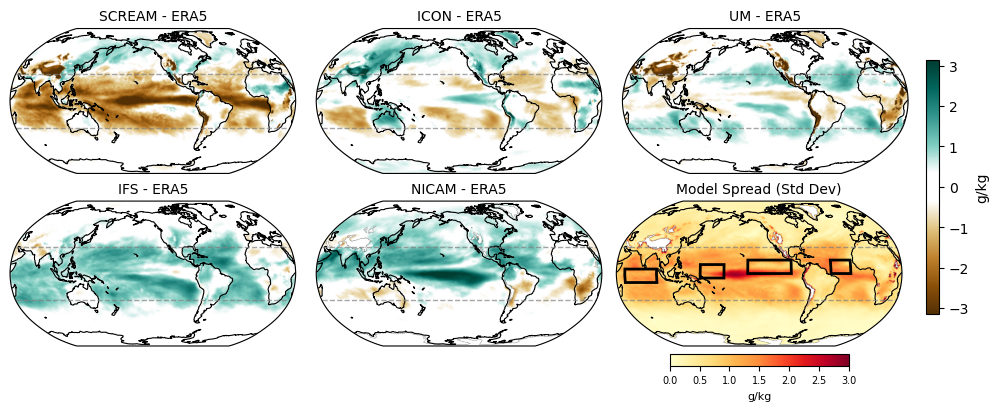

In [51]:
# Plot with region boxes
datasets = [q850_era5,
            q850_scream, 
            q850_icon, 
            q850_um,
            q850_ifs_regridded,
           q850_nicam]
dataset_names = ['ERA5', 'SCREAM', 'ICON', 'UM', 'IFS', 'NICAM']

fig_regions, axes_regions, images_regions = plot_anomalies(
    datasets, dataset_names, ref_idx=0, figsize=(10, 4),
    colorbar_label="g/kg",
    suptitle="",
    cmap=mycmap.brownTOwhiteTOgreen, vmax_spread=3, #vmin=-20, vmax=20,
    draw_regions=regions_to_draw  # Add this parameter to draw region boxes
)

plt.savefig('plots/q850_bias_fullyear_with_regions.png', dpi=300, bbox_inches='tight')

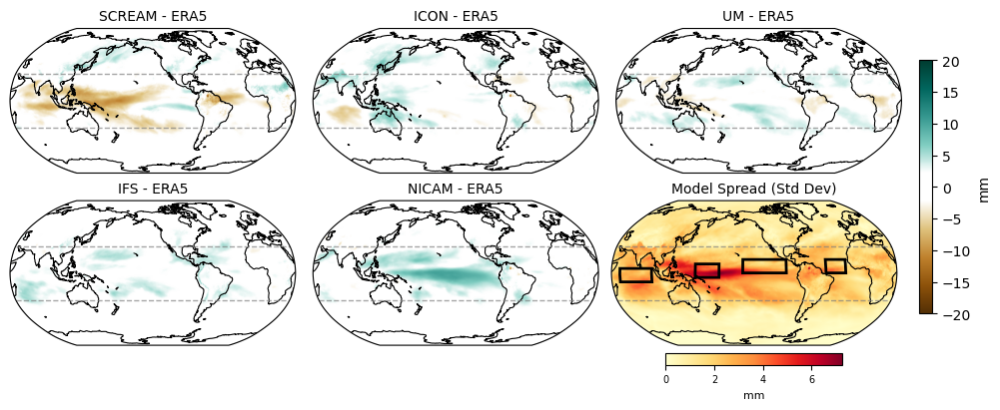

In [36]:
# Define regions as dictionaries with (lon_min, lon_max, lat_min, lat_max)
# These correspond to the box_* functions defined earlier
regions_to_draw = {
    "W Pacific": (150, 180, -5, 10),
    "E Pacific": (-150, -95, 0, 15),
    "Indian": (55, 95, -10, 5),
    "Atlantic": (-45, -20, 0, 15)
}

# Plot with region boxes
fig_regions, axes_regions, images_regions = plot_anomalies(
    datasets, dataset_names, ref_idx=0, figsize=(10, 4),
    colorbar_label="mm",
    suptitle="",
    cmap=mycmap.brownTOwhiteTOgreen, vmin=-20, vmax=20,
    draw_regions=regions_to_draw  # Add this parameter to draw region boxes
)

plt.savefig('plots/PRW_bias_fullyear_with_regions.png', dpi=300, bbox_inches='tight')

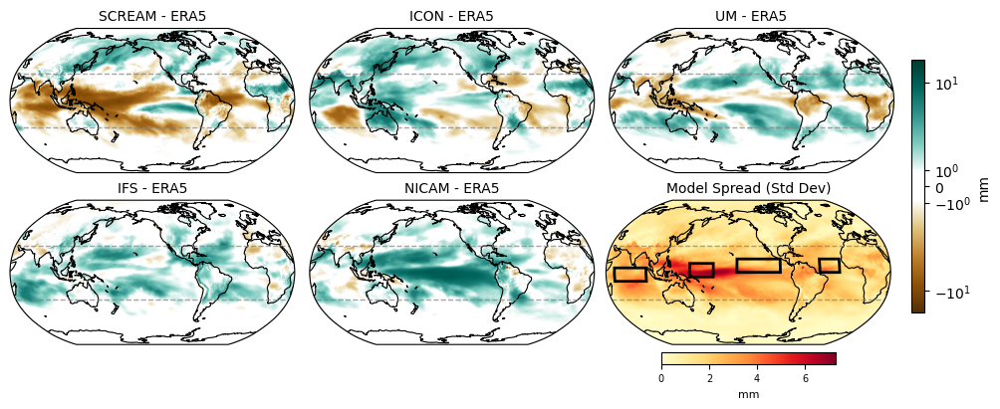

In [83]:
# Symmetric log scale - linear between -1 and 1, logarithmic outside
fig_regions, axes_regions, images_regions = plot_anomalies(
    datasets, dataset_names, ref_idx=0, figsize=(10, 4),
    colorbar_label="mm",
    cmap=mycmap.brownTOwhiteTOgreen, vmin=-20, vmax=20,
    norm_type='symlog',  # Use symmetric log
    linthresh=5,  # Linear scale between -5 and 5
    draw_regions=regions_to_draw
)

plt.savefig('plots/PRW_bias_fullyear_symlog_with_regions.png', dpi=300, bbox_inches='tight')

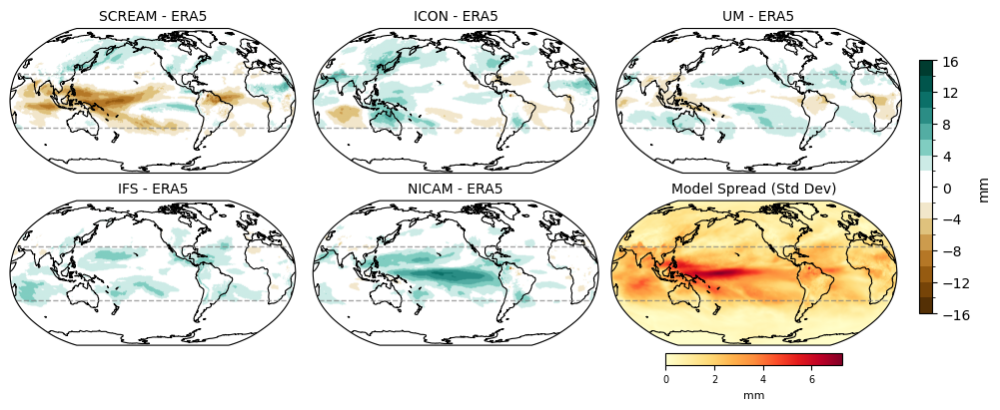

In [113]:

plt.savefig('plots/PRW_bias_fullyear_linear_discretelevels.png', dpi=300, bbox_inches='tight')

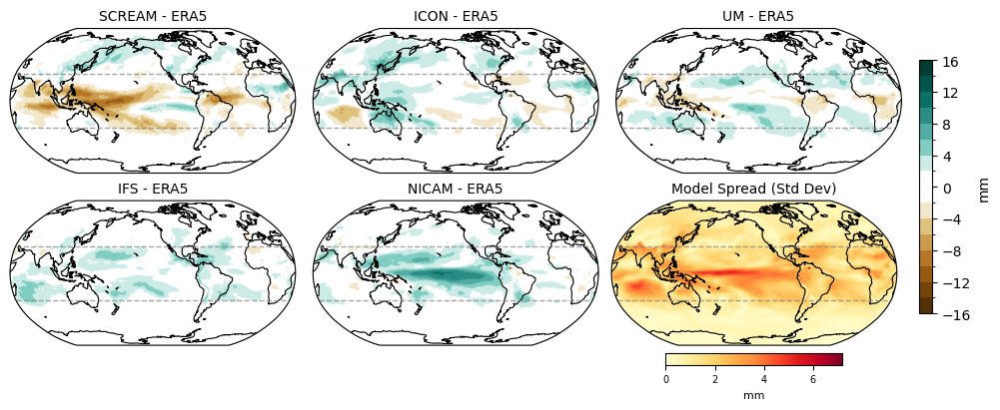

In [118]:
fig3, axes3, images3 = plot_anomalies(
    datasets, dataset_names, ref_idx=0, figsize=(10, 4),
    colorbar_label="mm",
    suptitle="",exclude_obs4spread=True,
    cmap=mycmap.brownTOwhiteTOgreen, norm_type='custom',  # Use custom discrete levels
    custom_levels=np.arange(-16,18,2),)  # Pass the levels)
plt.savefig('plots/PRW_bias_fullyear_linear_discrete_onlymodelspread.png', dpi=300, bbox_inches='tight')

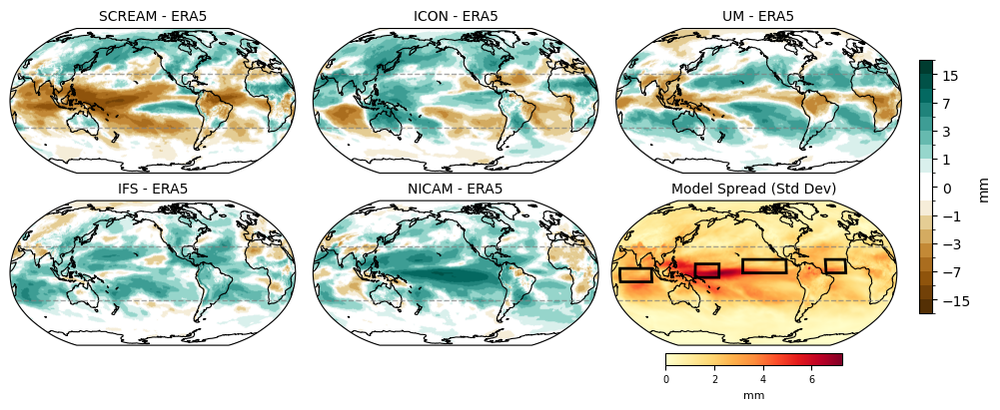

In [81]:
prw_levels = [-20, -15, -10, -7, -5, -3, -2, -1, -0.5, 0, 0.5, 1, 2, 3, 5, 7, 10, 15, 20]

# Plot with custom levels
fig_custom, axes_custom, images_custom = plot_anomalies(
    datasets, dataset_names, ref_idx=0, figsize=(10, 4),
    colorbar_label="mm",
    cmap=mycmap.brownTOwhiteTOgreen,
    norm_type='custom',  # Use custom discrete levels
    custom_levels=prw_levels,  # Pass the levels
    draw_regions=regions_to_draw
)


plt.savefig('plots/PRW_bias_fullyear_discretelevels_with_regions.png', dpi=300, bbox_inches='tight')

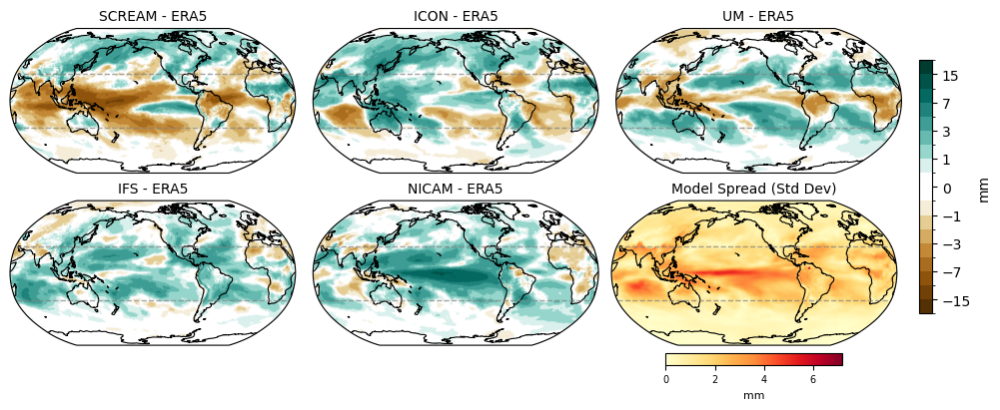

In [116]:
prw_levels = [-20, -15, -10, -7, -5, -3, -2, -1, -0.5, 0, 0.5, 1, 2, 3, 5, 7, 10, 15, 20]

# Plot with custom levels
fig_custom, axes_custom, images_custom = plot_anomalies(
    datasets, dataset_names, ref_idx=0, figsize=(10, 4),
    colorbar_label="mm",
    cmap=mycmap.brownTOwhiteTOgreen,exclude_obs4spread=True,
    norm_type='custom',  # Use custom discrete levels
    custom_levels=prw_levels,  # Pass the levels
    draw_regions=None
)



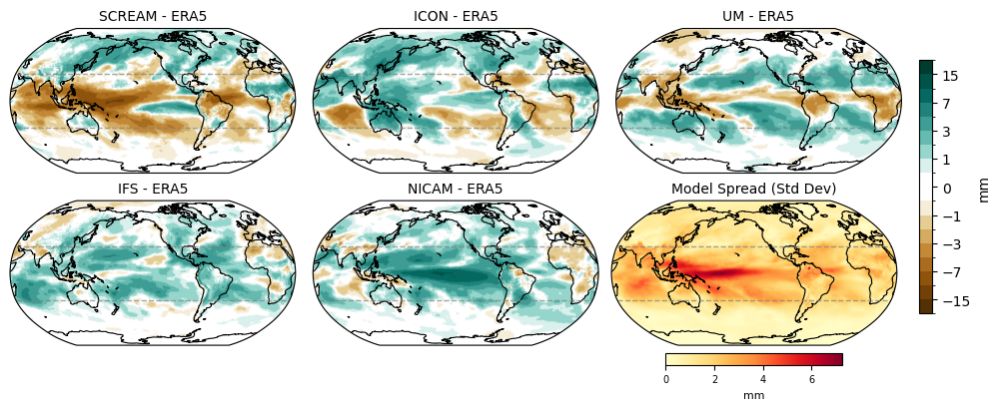

In [104]:

plt.savefig('plots/PRW_bias_fullyear_discretelevels.png', dpi=300, bbox_inches='tight')

In [65]:
datasets = [omega500_era5.where(dslf_scream.LANDFRAC.mean('time').squeeze()==0),
            omega500_scream.where(dslf_scream.LANDFRAC.mean('time').squeeze()==0), 
            omega500_icon.where(dslf_scream.LANDFRAC.mean('time').squeeze()==0), 
            omega500_um.where(dslf_scream.LANDFRAC.mean('time').squeeze()==0),
            omega500_ifs_regridded.where(dslf_scream.LANDFRAC.mean('time').squeeze()==0),
           omega500_nicam.where(dslf_scream.LANDFRAC.mean('time').squeeze()==0)]
dataset_names = ['ERA5', 'SCREAM', 'ICON', 'UM', 'IFS', 'NICAM']

In [45]:
print(omega500_era5.shape,
      omega500_scream.shape,
      omega500_icon.shape,
      omega500_um.shape,
      omega500_ifs_regridded.shape,
      omega500_nicam.shape)

(49152,) (49152,) (49152,) (49152,) (49152,) (49152,)


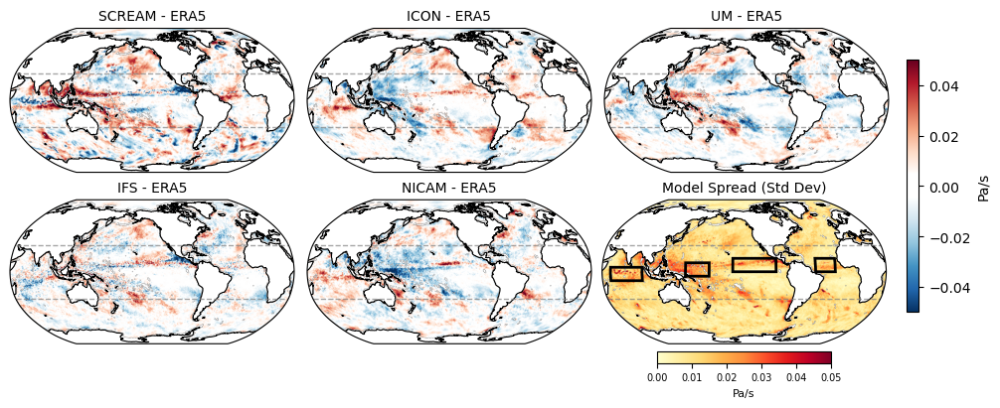

In [66]:
fig3, axes3, images3 = plot_anomalies(
    datasets, dataset_names, ref_idx=0, figsize=(10, 4),
    colorbar_label="Pa/s",
    suptitle="",
    cmap=mycmap.blueTOwhiteTOred, vmin=-0.05, vmax=0.05, vmax_spread = 0.05,draw_regions=regions_to_draw,
)
plt.savefig('plots/omega500_bias_fullyear_with_regions.png', dpi=300, bbox_inches='tight')

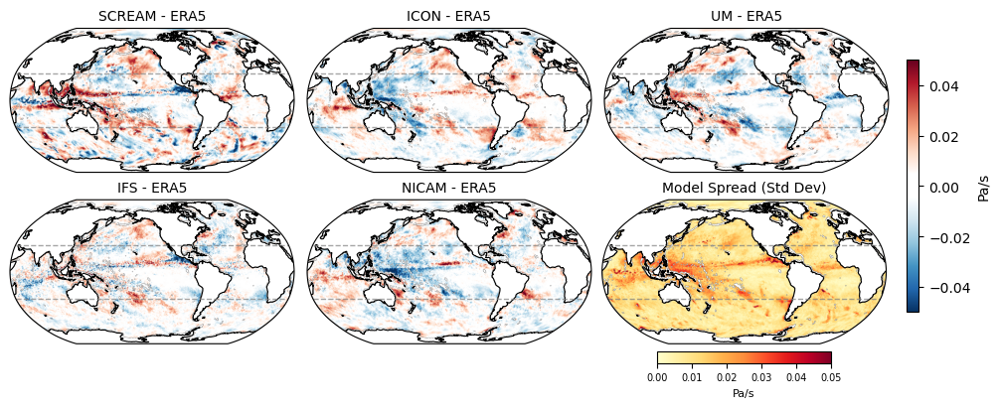

In [32]:
datasets = [sfcwind_era5.where(dslf_scream.LANDFRAC.mean('time').squeeze()==0),
            sfcwind_scream.where(dslf_scream.LANDFRAC.mean('time').squeeze()==0), 
            sfcwind_icon.where(dslf_scream.LANDFRAC.mean('time').squeeze()==0), 
            sfcwind_um.where(dslf_scream.LANDFRAC.mean('time').squeeze()==0),
            sfcwind_ifs_regridded.where(dslf_scream.LANDFRAC.mean('time').squeeze()==0),
           sfcwind_nicam.where(dslf_scream.LANDFRAC.mean('time').squeeze()==0)]
dataset_names = ['ERA5', 'SCREAM', 'ICON', 'UM', 'IFS', 'NICAM']

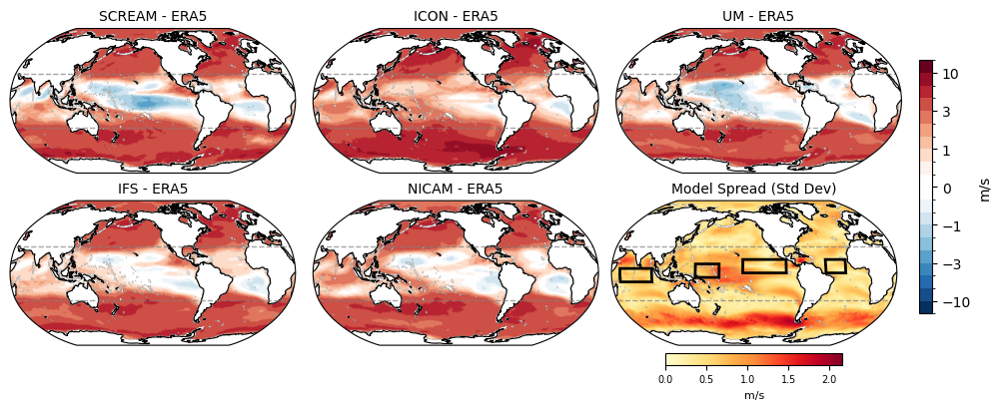

In [40]:
w_levels = [-15, -10, -7, -5, -3, -2, -1.5,-1, -0.5, -0.25, 0, 0.25, 0.5, 1,1.5, 2, 3, 5, 7, 10, 15]
regions_to_draw = {
    "W Pacific": (150, 180, -5, 10),
    "E Pacific": (-150, -95, 0, 15),
    "Indian": (55, 95, -10, 5),
    "Atlantic": (-45, -20, 0, 15)
}
# Example: omega500 plot with region boxes
fig_omega_regions, axes_omega_regions, images_omega_regions = plot_anomalies(
    datasets, dataset_names, ref_idx=0, figsize=(10, 4),
    colorbar_label="m/s",
    suptitle="",
    cmap=mycmap.blueTOwhiteTOred, norm_type='custom',custom_levels=w_levels,
    draw_regions=regions_to_draw  # Draw region boxes on the spread subplot
)
plt.savefig('plots/sfcwind_bias_fullyear_with_regions.png', dpi=300, bbox_inches='tight')

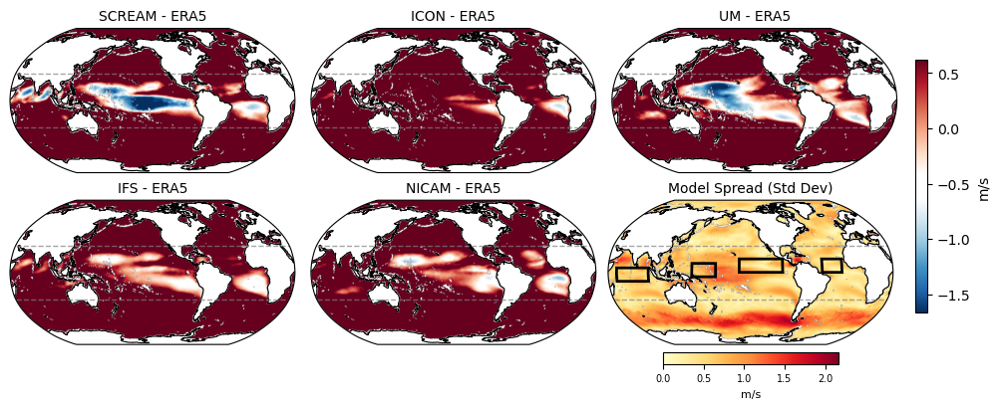

In [61]:
datasets = [omega850_era5.where(dslf_scream.LANDFRAC.mean('time').squeeze()==0),
            omega850_scream.where(dslf_scream.LANDFRAC.mean('time').squeeze()==0), 
            omega850_icon.where(dslf_scream.LANDFRAC.mean('time').squeeze()==0), 
            omega850_um.where(dslf_scream.LANDFRAC.mean('time').squeeze()==0),
            omega850_ifs_regridded.where(dslf_scream.LANDFRAC.mean('time').squeeze()==0),
           omega850_nicam.where(dslf_scream.LANDFRAC.mean('time').squeeze()==0)]
dataset_names = ['ERA5', 'SCREAM', 'ICON', 'UM', 'IFS', 'NICAM']

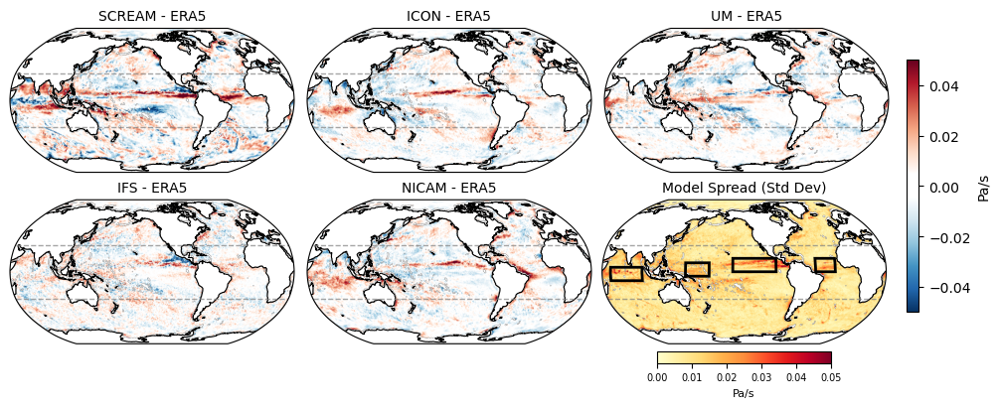

In [62]:
fig3, axes3, images3 = plot_anomalies(
    datasets, dataset_names, ref_idx=0, figsize=(10, 4),
    colorbar_label="Pa/s",
    suptitle="",draw_regions=regions_to_draw,
    cmap=mycmap.blueTOwhiteTOred, vmin=-0.05, vmax=0.05, vmax_spread = 0.05
)
plt.savefig('plots/omega850_bias_fullyear_with_regions.png', dpi=300, bbox_inches='tight')

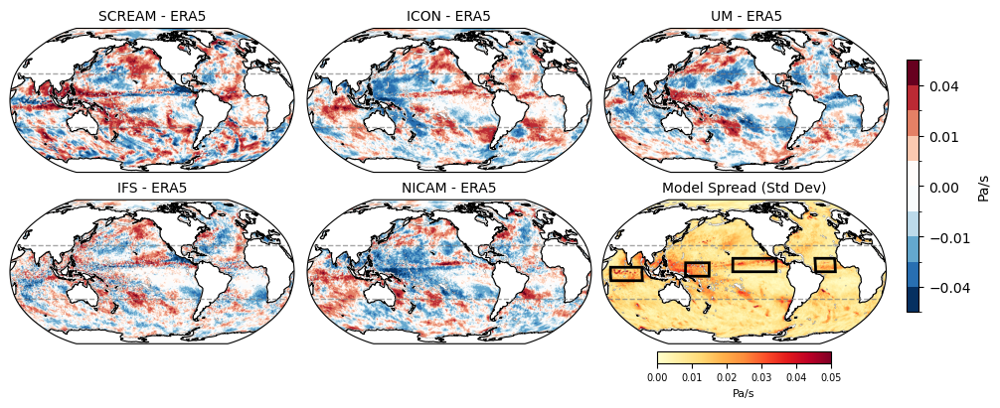

In [71]:
w_levels = [-0.06, -0.04, -0.02, -0.01, -0.005,  0, 0.005, 0.01, 0.02, 0.04, 0.06]

fig3, axes3, images3 = plot_anomalies(
    datasets, dataset_names, ref_idx=0, figsize=(10, 4),
    colorbar_label="Pa/s",
    suptitle="",draw_regions=regions_to_draw,
    cmap=mycmap.blueTOwhiteTOred, norm_type='custom',custom_levels=w_levels, vmax_spread = 0.05
)
plt.savefig('plots/omega850_bias_fullyear_with_regions.png', dpi=300, bbox_inches='tight')

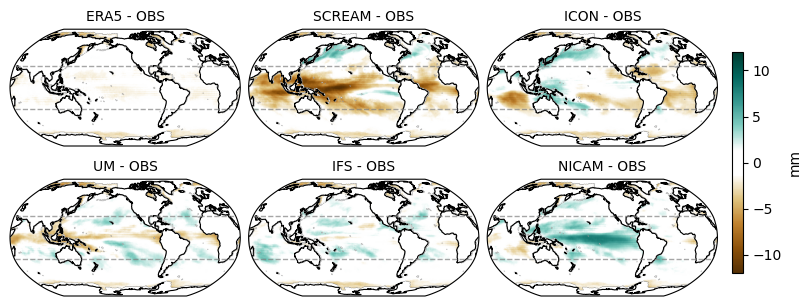

In [45]:
datasets = [prw_obs,
            prw_era,
            prw_scream, 
            prw_icon, 
            prw_um,prw_ifs,
            prw_nicam]
dataset_names = ['OBS', 'ERA5', 'SCREAM', 'ICON', 'UM', 'IFS', 'NICAM'] #ICDR
fig3, axes3, images3 = plot_anomalies(
    datasets, dataset_names, ref_idx=0, figsize=(8, 3),
    colorbar_label="mm",
    suptitle="",
    cmap=mycmap.brownTOwhiteTOgreen, vmin=-12, vmax=12
)
plt.savefig('plots/PRW_bias_fullyear.png', dpi=300, bbox_inches='tight')

In [49]:
models = {
    "ERA5": prw_era,
    "SCREAM": prw_scream,
    "ICON":   prw_icon,
    "UM":     prw_um,
    "IFS":    prw_ifs_regridded,
    "NICAM":    prw_nicam
}
obs = prw_obs


In [52]:
colors = {'ERA5': 'black' ,'ICON': '#ff7f0e', 'SCREAM': '#2ca02c' , 'UM': 'salmon', 'IFS':"steelblue", "NICAM":"mediumpurple"}


In [53]:
regions = {
    "W Pacific": box_wpacific,
    "E Pacific": box_epacific,
    "Indian":    box_indian,
    "Atlantic":  box_atlantic
}

In [54]:
def compute_regional_biases(regions, models,obs, ylabel = 'Bias (Model - OBS)', 
                            plot_path= '/global/cfs/cdirs/wcm_code/lpaccini/scripts/waccem_repo_scripts/gsrm_mcs_environments/analysis/plots',
                            plot_name='PRW_bias_byregion_fullyear'):
# ---- Compute biases ----
    bias = {region: {} for region in regions}
    for region_name, mask in regions.items():
        for model_name, model_ds in models.items():
            model_mean = model_ds.where(mask(model_ds)).mean('cell')
            obs_mean   = obs.where(mask(obs)).mean('cell')
            bias[region_name][model_name] = (model_mean - obs_mean).item()
    region_names = list(regions.keys())
    model_names = list(models.keys())
    x = range(len(region_names))
    bar_width = 0.15
    
    plt.figure(figsize=(6,4))
    
    for i, model in enumerate(model_names):
        values = [bias[r][model] for r in region_names]
        plt.bar([p + i*bar_width for p in x],
                values,
                width=bar_width,
                label=model,
                color=colors[model])
    
    plt.xticks([p + 1.5*bar_width for p in x], region_names, rotation=0)
    plt.ylabel(ylabel)
    plt.title("Model Bias vs Observations per Region")
    plt.legend(ncols=3,frameon=False)
    plt.savefig(plot_path+plot_name, dpi=300, bbox_inches='tight')        

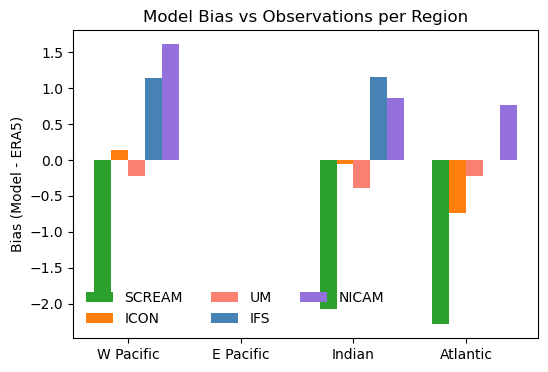

In [57]:
models_q850 = { "SCREAM":q850_scream, 
            "ICON": q850_icon, 
            "UM": q850_um,
            "IFS": q850_ifs_regridded,
           "NICAM": q850_nicam}
obs_q850 = q850_era5
compute_regional_biases(regions,models_q850,obs_q850, ylabel='Bias (Model - ERA5)',plot_name='q850_bias_byregion_fullyear.png')

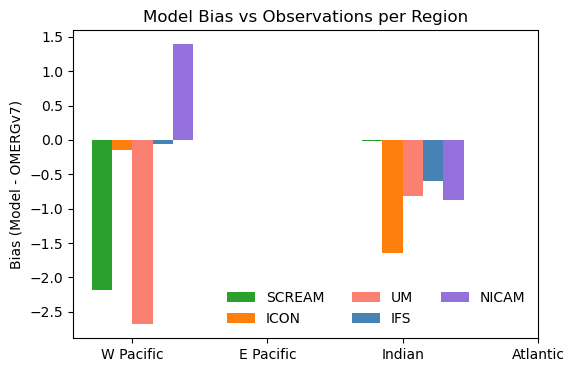

In [58]:
models_pr = { "SCREAM":pr_scream_regridded, 
            "ICON": pr_icon_regridded, 
            "UM": pr_um_regridded,
            "IFS": pr_ifs_regridded,
           "NICAM": pr_nicam_regridded}
obs_pr = pr_imerg_regridded
compute_regional_biases(regions,models_pr,obs_pr, ylabel='Bias (Model - OMERGv7)',plot_name='PR_bias_byregion_fullyear.png')

In [55]:
models_omega850 = {
    # "ERA5": omega850_era5,
    "SCREAM": omega850_scream,
    "ICON":   omega850_icon,
    "UM":     omega850_um,
    "IFS":    omega850_ifs_regridded,
    "NICAM":    omega850_nicam
}
obs_omega850 = omega850_era5

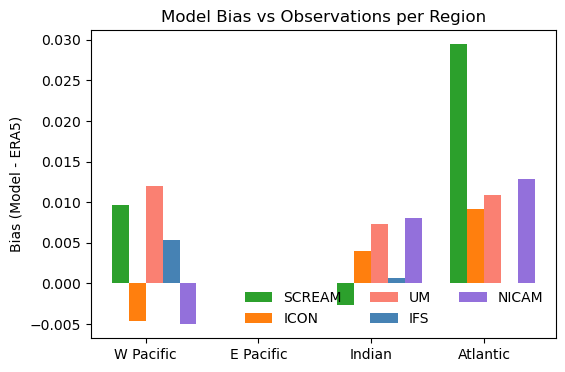

In [56]:
compute_regional_biases(regions,models_omega850,obs_omega850, ylabel='Bias (Model - ERA5)',plot_name='omega850_bias_byregion_fullyear.png')

In [59]:
models_omega500 = {
    # "ERA5": omega850_era5,
    "SCREAM": omega500_scream,
    "ICON":   omega500_icon,
    "UM":     omega500_um,
    "IFS":    omega500_ifs_regridded,
    "NICAM":    omega500_nicam
}
obs_omega500 = omega500_era5

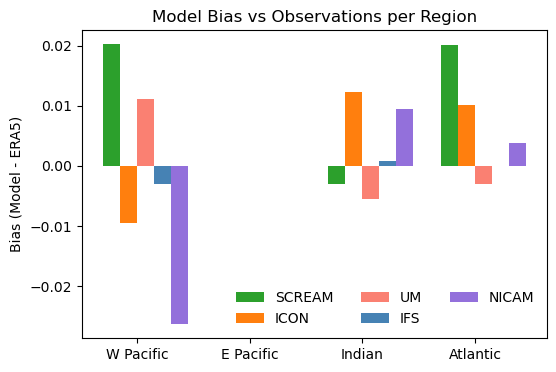

In [60]:
compute_regional_biases(regions,models_omega500,obs_omega500, ylabel='Bias (Model - ERA5)',plot_name='omega500_bias_byregion_fullyear.png')

In [44]:
models_sfcwind = {
    # "ERA5": omega850_era5,
    "SCREAM": sfcwind_scream,
    "ICON":   sfcwind_icon,
    "UM":     sfcwind_um,
    "IFS":    sfcwind_ifs_regridded,
    "NICAM":    sfcwind_nicam
}
obs_sfcwind = sfcwind_era5

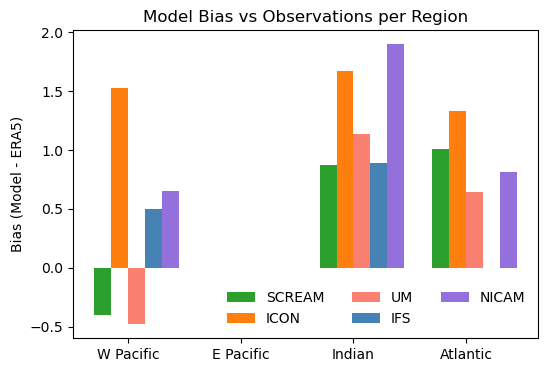

In [45]:
compute_regional_biases(regions,models_sfcwind,obs_sfcwind, ylabel='Bias (Model - ERA5)',
                        plot_name='sfcwind_bias_byregion_fullyear.png')

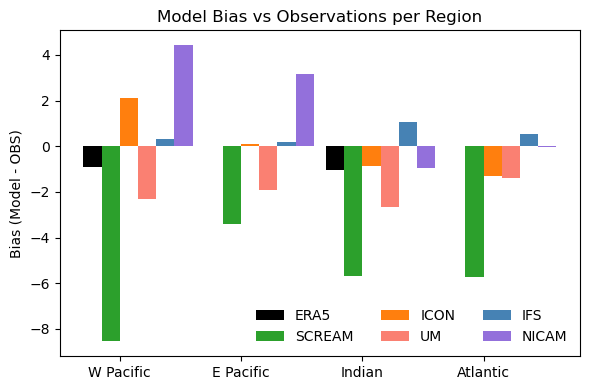

In [51]:
# ---- Prepare plot ---- smaller east pacific
region_names = list(regions.keys())
model_names = list(models.keys())
x = range(len(region_names))
bar_width = 0.15

plt.figure(figsize=(6,4))

for i, model in enumerate(model_names):
    values = [bias[r][model] for r in region_names]
    plt.bar([p + i*bar_width for p in x],
            values,
            width=bar_width,
            label=model,
            color=colors[model])

plt.xticks([p + 1.5*bar_width for p in x], region_names, rotation=0)
plt.ylabel("Bias (Model - OBS)")
plt.title("Model Bias vs Observations per Region")
plt.legend(ncols=3,frameon=False)
plt.tight_layout()
# plt.show()

plt.savefig('plots/PRW_bias_byregion_fullyear.png', dpi=300, bbox_inches='tight')